In [1]:
import os
import pandas as pd
import requests
import shutil 
import numpy as np
from pymol import cmd
from pymol import stored
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from Bio import SeqIO
import subprocess
from io import StringIO
from os.path import isfile
import json

# Functions

In [2]:
#fixing '5E54' becoming '5.00E+54' issue
def fix_PDB_ID(df):
    for i, j in enumerate(df['PDB_ID']):
        print (j)
        if len(str(j))>4:
            if '-' in j:
                X= ''.join(j.split('-')).upper()
                df.loc[i, 'PDB_ID']= X
            else:
                if '.' in j:
                    x= str(j)
                    x1= x.split('.')[0]
                    x2= x.split('+')[1]
                    X= x1+'E'+x2
                    print (X)
                    df.loc[i, 'PDB_ID']= X
                else:
                    x= str(j)
                    x1= x.split('+')[0]
                    x2= x.split('+')[1]
                    X= x1+ x2
                    print (X)
                    df.loc[i, 'PDB_ID']= X
                    
    return (df)

In [3]:
#function to extract structure file in cif format and convert as a pandas dataframe
def extract_cif(p):
    filename= p+'.cif'
    url= 'https://files.rcsb.org/view/%s' %filename 
    u = requests.get(url).content
    u1= str(u).split('#')
    if len(u1)==1:
        print ('STRUCTURE IS NOT AVAILABLE!')
        return '0'
    
    else:
        c_intrst= ['_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
           '_atom_site.label_atom_id', '_atom_site.label_alt_id',
           '_atom_site.label_comp_id', '_atom_site.label_asym_id',
           '_atom_site.label_entity_id', '_atom_site.label_seq_id',
           '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
           '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
           '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
           '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
           '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
           '_atom_site.pdbx_PDB_model_num', '###']
        u2=[]
        for i, j in enumerate(u1):
            if c_intrst[0] in j:
                u2.append(j)

        if len(u2)==2:
            if len(u2[0])> len(u2[1]):
                u3= u2[0].replace('      ', '$')
            else:
                u3= u2[1].replace('      ', '$')
        else:
            u3= u2[0].replace('      ', '$')
        u4= u3.replace('     ', '$')
        u5= u4.replace('    ', '$')
        u6= u5.replace('   ', '$')
        u7= u6.replace('  ', '$')
        u8= u7.replace(' ', '$')
        u9= u8.replace('$$', '$')
        u10= u9.replace('\\\\', '').split('\\n')
        df = pd.DataFrame({'all_col':u10[23:]})

        df[c_intrst] = df['all_col'].str.split('$', expand=True)
        df= df.drop(['all_col', '###'], axis=1)

        return df

In [4]:
#function to clip residues of interest and store as cif file
def clip(p, c, s, l, n, h, m, F):
    #p= pdb_ID, entries can be case-insensitive
    #c= chain ID
    #s= seg ID, this is an optional value, if you do not know the seg ID of your residues of interest, just put ''
    #l= list of index for the residue of interest, items in this list should be strings, not integer
    #if you want all the residues for your chain of interest, just put '' for l
    #n= incase you have icode in the residue index for the residue of interest,
    #instead of providing all the residue indexes as a list in l, just give the index of the starting index
    #as a single string for l, and for n give the list of two numbers, first number will indicate how many residues 
    #before the residue of index you want, the second number will indicate how many residues after the residue of
    #inerest you want. If the residue of interest does not contain, icode, and/or you know all the residue indexes 
    #for the residues you want, just put '' for n
    #for instance, l= '47A', and n= [2, 7], means I want 2 residues before the residue at '47A' 
    # and 7 residue followed by residue at '47A'
    #h= 'N' or 'Y', if 'N', that means no hydrogen coordinates should be included considering hydrogen coordinates are provided
    #m= 'N' or 'Y', if 'N', that means no modified or non-RNA residues should be included 
    #if 'Y', that means no hydrogen coordinates should be removed if any hydrogen coordinates are provided
    #F= desired output filename (without the .cif extension)
    P= p.upper()
    
    #converting the cif file into dataframe
    p1= extract_cif(P)
    if len(p1)>1:
        #applying chain ID and seg ID filter 
        if len(s) ==0:
            p2= p1[(p1['_atom_site.auth_asym_id']==c)] 
            p2.index= np.arange(0, len(p2))
        else:
            p2= p1[(p1['_atom_site.auth_asym_id']==c)& (p1['_atom_site.label_asym_id']==s)] 
            p2.index= np.arange(0, len(p2))
    
        #converting index column values to integer
        #p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
        if isinstance(l, list):
            l= [str(item) for item in l]
            print (l)
            p3= p2[p2['_atom_site.auth_seq_id'].isin(l)]
            p3.index= np.arange(0, len(p3))
        elif len(l)>0:
            p2['index_icode']= p2['_atom_site.auth_seq_id']+ p2['_atom_site.pdbx_PDB_ins_code']
            #print (p2['index_icode'].to_list())
            ext_loc= int(p2[p2['index_icode'] == l]['_atom_site.label_seq_id'].to_list()[0])
            ext_locs= []
            for inds in range(ext_loc-n[0], ext_loc+n[1]):
                ext_locs.append(str(inds))
            p3= p2[p2['_atom_site.label_seq_id'].isin(ext_locs)]
            p3.index= np.arange(0, len(p3))
            p3 = p3.drop(columns=['index_icode'])
        elif len(l)==0:
            p3= p2.copy()
        
        #filtering out or not hydrogen atoms
        if h== 'N':
            p3_h= p3[p3['_atom_site.type_symbol']!= 'H']
            p3_h.index= np.arange(0, len(p3_h))
        else:
            p3_h= p3.copy()

        if m== 'N':
            p3_m = p3_h[p3_h['_atom_site.auth_comp_id'].str.len() < 2]
            p3_m.index= np.arange(0, len(p3_m))
        else:
            p3_m= p3_h.copy()
    
        #cleaning name for the sugar atoms
        for i, j in enumerate(p3_m['_atom_site.label_atom_id']):
            if "\\'" in j:
                #print (j)
                #print (j)
                x= (j.replace("\\'", "'"))
                y= (x.replace('"', ''))
                p3_m.loc[i, '_atom_site.label_atom_id'] = y
                p3_m.loc[i, '_atom_site.auth_atom_id'] = y
        
        #renumber the residue index starting from 1
        
        print ('=============================================================')
        init_res_ind= list(set(p3_m['_atom_site.auth_seq_id'].to_list()))
        print (init_res_ind)
        init_res_ind.sort()
        
        ind_count= 0
        ind_dict={}
        for ind_ind, ind_val in enumerate(init_res_ind):
            ind_count +=1
            ind_dict[ind_val]= str(ind_count)
        
        p3_m['_atom_site.auth_seq_id'] = p3_m['_atom_site.auth_seq_id'].replace(ind_dict)
        final_res_ind= list(set(p3_m['_atom_site.auth_seq_id'].to_list()))
        print (final_res_ind)
        print ('=============================================================')
        
        #Creating dataframe for the column name
        c_intrst_1= ['_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
               '_atom_site.label_atom_id', '_atom_site.label_alt_id',
               '_atom_site.label_comp_id', '_atom_site.label_asym_id',
               '_atom_site.label_entity_id', '_atom_site.label_seq_id',
               '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
               '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
               '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
               '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
               '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
               '_atom_site.pdbx_PDB_model_num']
        c_intrst_2= ['data_', '#','loop_', '_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
               '_atom_site.label_atom_id', '_atom_site.label_alt_id',
               '_atom_site.label_comp_id', '_atom_site.label_asym_id',
               '_atom_site.label_entity_id', '_atom_site.label_seq_id',
               '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
               '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
               '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
               '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
               '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
               '_atom_site.pdbx_PDB_model_num']
    
        c_intrst_2[0]= 'data_'+P
    
        p4= pd.DataFrame(columns= c_intrst_1)
        p4['_atom_site.group_PDB']= c_intrst_2 #this p3 dataframe above p2 will be joined in p4. p3 will help pymol to visualize the file
    
        p5 = pd.concat([p4, p3_m], axis=0)
        
        
        
    
        p5.to_csv(F+'.cif', header= False, sep=' ', index= False) #unmute this
        return p3_m
        #print ('WE COMPLETED THIS FARRRRRRRR')
        #p5.to_csv(P+'_clipped.cif', header= False, sep=' ', index= False)
    else:
        print ('STRUCTURE IS NOT AVAILABLE!')

In [5]:
def generate_cls_str(df, tar_dir):
    
    #tar_dir= '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/test'
    home= os.getcwd()
    
    os.chdir(tar_dir)
    df = df.dropna(subset=['cluster'])
    print (df.shape)
    cls_names= list(set(df['cluster'].to_list()))
    cls_names.sort()
    #cls_names= cls_name_i.sort()
    print (cls_names)
        
    df['bp_ID']= df['bp_ID'].str.replace('-', '_', regex=False)
    
    for i, j in enumerate(cls_names):
        #temp lines
        if j== 'C1':
            fln= 3
            
        elif j== 'C2':
            fln= 4
            
        elif j== 'C3':
            fln= 9
            
        elif j== 'C4':
            fln= 6
        
        cls_path = os.path.join(tar_dir, j)
        os.makedirs(cls_path, exist_ok=True)
        
        os.chdir(cls_path)
        
        df_c= df[df['cluster']== j]
        df_c.index= np.arange(0, len(df_c))
        for k, l in enumerate(df_c['bp_ID']):
            res1_index= int(df_c['res_index_res1'][k])
            res2_index= int(df_c['res_index_res2'][k])
            p= df_c['PDB_ID'][k]
            c= df_c['chain_ID'][k]
            s= df_c['seg_ID'][k]
            resn_list_motif= [k for k in range(res1_index-fln, res2_index+fln+1)]
            resn_list_motif.sort()
            filename= j+'_'+l
            cls_str= clip(p, c, s, resn_list_motif, '', 'N', 'Y', filename)
            
        os.chdir(home)

    os.chdir(home)
    #return all_seqs

In [6]:
print (os.getcwd())

/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis


# Import data

In [7]:
r= pd.read_csv('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/identify_shifted_wobble/scripts/reg_3_nr_8_NOV2024.csv')

# clipping motifs containing clusterd wobbles

In [314]:
generate_cls_str(r, '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks')

(24, 120)
['C1', 'C2', 'C3', 'C4']
['1080', '1081', '1082', '1083', '1084', '1085', '1086', '1087', '1088', '1089', '1090', '1091', '1092', '1093', '1094', '1095', '1096', '1097', '1098', '1099']
['1093', '1096', '1081', '1094', '1087', '1083', '1099', '1080', '1086', '1085', '1095', '1082', '1092', '1088', '1090', '1089', '1091', '1097', '1098', '1084']
['15', '3', '14', '4', '7', '18', '16', '13', '19', '5', '6', '8', '17', '10', '11', '2', '9', '20', '12', '1']
['1083', '1084', '1085', '1086', '1087', '1088', '1089', '1090', '1091', '1092', '1093', '1094', '1095', '1096', '1097', '1098', '1099', '1100', '1101', '1102']
['1093', '1096', '1094', '1087', '1083', '1099', '1086', '1085', '1095', '1102', '1092', '1100', '1088', '1090', '1089', '1091', '1097', '1098', '1084', '1101']
['15', '3', '14', '4', '7', '18', '16', '13', '19', '5', '6', '8', '17', '10', '11', '2', '9', '20', '12', '1']
['1077', '1078', '1079', '1080', '1081', '1082', '1083', '1084', '1085', '1086', '1087', '1088', 

['681', '682', '683', '684', '685', '686', '687', '688', '689', '690', '691', '692', '693', '694', '695', '696', '697', '698', '699', '700', '701', '702', '703', '704', '705', '706', '707', '708', '709', '710', '711', '712', '713', '714', '715', '716', '717', '718', '719', '720', '721', '722', '723', '724', '725']
['701', '682', '686', '714', '710', '683', '718', '719', '721', '708', '706', '703', '696', '695', '707', '699', '689', '715', '724', '705', '690', '723', '713', '720', '693', '717', '709', '697', '704', '698', '691', '694', '725', '702', '711', '688', '716', '687', '684', '722', '700', '712', '692', '685', '681']
['39', '30', '15', '3', '23', '28', '35', '14', '27', '25', '4', '31', '22', '7', '18', '36', '38', '16', '13', '40', '19', '5', '43', '6', '8', '33', '45', '42', '37', '17', '26', '21', '41', '10', '24', '44', '34', '29', '32', '11', '2', '9', '20', '12', '1']
['673', '674', '675', '676', '677', '678', '679', '680', '681', '682', '683', '684', '685', '686', '687', 

['2298', '2299', '2300', '2301', '2302', '2303', '2304', '2305', '2306', '2307', '2308', '2309', '2310', '2311', '2312', '2313', '2314', '2315', '2316', '2317', '2318']
['2300', '2316', '2298', '2305', '2310', '2315', '2299', '2306', '2314', '2308', '2309', '2311', '2301', '2317', '2313', '2302', '2304', '2303', '2318', '2312', '2307']
['15', '3', '14', '4', '7', '18', '16', '13', '19', '5', '6', '8', '17', '21', '10', '11', '2', '9', '20', '12', '1']


# characterizing, dbn, fa

In [8]:
home= os.getcwd()

C1_dir= '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/C1'
C2_dir= '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/C2'
C3_dir= '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/C3'
C4_dir= '/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/C4'

In [9]:
def chr_dbn_fa(wdir, fl_length):
    
    dir= os.getcwd()
    os.chdir(wdir)
    count= 0
    all_seqs={}
    for filename in os.listdir('.'):
        if filename.endswith('.cif'):
            count +=1
            print (count)
            #print (filename)
            pname= filename[:len(filename)-4]+'-dssr.json'
            #print (pname)
            x= dir+'/'+ pname
            if isfile(x)== True:
                print ('ALREADY CHARACTERIZED')
            else:
                print ('NOT CHARACTERIZED YET')
                print (filename)
                #characterizing
                os.system('./x3dna-dssr -i='+filename+ ' --json -o='+ filename[:len(filename)-4]+'-dssr.json')
                
                #open the json file
                with open(filename[:len(filename)-4]+'-dssr.json', 'r') as f:
                    data= json.loads(f.read())
    
                bps_df= pd.json_normalize(data, record_path =['pairs'])
                bp_dict= {}
                for nti, ntj in enumerate(bps_df['nt1']):
                    nt1_r= ntj.split('.')[1][1:]
                    nt2_r= bps_df['nt2'][nti].split('.')[1][1:]  
                    if nt1_r in bp_dict:
                        pass
                    else:
                        bp_dict[nt1_r]= nt2_r
                
                
                print (bp_dict)
                #generating dbn
                for f in os.listdir('.'):
                    if f=='dssr-2ndstrs.dbn':
                        dbn_df= pd.read_csv(f)
                        cols= dbn_df.columns[0]
                        seq= dbn_df[cols][0]
                        dbn_list=['.']*len(seq)
                        
                        dbn_list[fl_length]= '('
                        dbn_list[len(seq)-fl_length-1]= ')'
                        
                        seq_loc= 0
                        wrs= [str(fl_length+1), str(len(seq)-fl_length)] #residue indexes for the residues forming shifted wobble
                        
                        for x1 in bp_dict:
                            if x1 in wrs or bp_dict[x1] in wrs:
                                pass
                            else:
                                dbn_list[int(x1)-1]= '('
                                dbn_list[int(bp_dict[x1])-1]= ')'
                        
                        #for x1, x2 in enumerate(dbn_list):
                        #    if str(x1+1) in bp_dict:
                        #        print ('--------------------')
                        #        print (bp_dict[str(x1+1)])
                        #        dbn_list[x1]= '('
                        #        dbn_list[int(bp_dict[str(x1+1)])-1]= ')'
                        #    else:
                        #        pass
                          
                        #sec_str= dbn_df[cols][1]
                        sec_str= ''.join(dbn_list)
                    
                        print ('We did it')
                        print (seq)
                        print (sec_str)
                        print ('We are done')
                        all_seqs[cols]= seq
                    
                        with open(filename[:len(filename)-4]+'.dbn', 'w') as file:
                            file.write(dbn_df.columns[0] + '\n')
                            file.write(seq + '\n')
                            file.write(sec_str + '\n')


                    if f.startswith('dssr-'):
                        os.remove(f)

    #generating .fa file                    
    seq_fname= list(set([i[:2] for i in os.listdir('.') if i.endswith('.cif')]))[0]+ '_seqs.fa'
    with open(seq_fname, "w") as f:
        for i in all_seqs:
            f.write('>'+ i[4:] + '\n')
            f.write(all_seqs[i] + '\n')
    os.chdir(dir)

In [ ]:
############################################################################
####################             OLD                ########################
############################################################################

#we want to include all base pairs in the dbn format
def chr_dbn_fa(wdir):
    dir= os.getcwd()
    os.chdir(wdir)
    count= 0
    all_seqs={}
    for filename in os.listdir('.'):
        if filename.endswith('.cif'):
            count +=1
            print (count)
            #print (filename)
            pname= filename[:len(filename)-4]+'-dssr.json'
            #print (pname)
            x= dir+'/'+ pname
            if isfile(x)== True:
                print ('ALREADY CHARACTERIZED')
            else:
                print ('NOT CHARACTERIZED YET')
                print (filename)
                #characterizing
                os.system('./x3dna-dssr -i='+filename+ ' --json -o='+ filename[:len(filename)-4]+'-dssr.json')
                #open the json file here
                
                #generating dbn
                for f in os.listdir('.'):
                    if f=='dssr-2ndstrs.dbn':
                        dbn_df= pd.read_csv(f)
                        cols= dbn_df.columns[0]
                        seq= dbn_df[cols][0]
                        sec_str= dbn_df[cols][1]
                    
                        print (seq)
                        print (sec_str)
                        all_seqs[cols]= seq
                    
                        with open(filename[:len(filename)-4]+'.dbn', 'w') as file:
                            file.write(dbn_df.columns[0] + '\n')
                            for index, row in dbn_df.iterrows():
                                file.write(row[cols] + '\n')


                    if f.startswith('dssr-'):
                        os.remove(f)

    #generating .fa file                    
    seq_fname= list(set([i[:2] for i in os.listdir('.') if i.endswith('.cif')]))[0]+ '_seqs.fa'
    with open(seq_fname, "w") as f:
        for i in all_seqs:
            f.write('>'+ i[4:] + '\n')
            f.write(all_seqs[i] + '\n')
    os.chdir(dir)

In [315]:
chr_dbn_fa(C1_dir, 3)
chr_dbn_fa(C2_dir, 4)
chr_dbn_fa(C3_dir, 9)
chr_dbn_fa(C4_dir, 6)

1
NOT CHARACTERIZED YET
C1_7M4Y_a_U1083_a_G1096.cif



Processing file 'C1_7M4Y_a_U1083_a_G1096.cif'
[i] 'C1_7M4Y_a_U1083_a_G1096.cif' taken as in .cif format by file extension.
    total number of nucleotides: 20
    total number of base pairs: 6
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 4
    total number of splayed-apart dinucleotides: 4
                        consolidated into units: 3
    total number of hairpin loops: 1
    total number of non-loop single-stranded segments: 2

Time used: 00:00:00:00

Processing file 'C1_7UNU_a_U1080_a_G1093.cif'
[i] 'C1_7UNU_a_U1080_a_G1093.cif' taken as in .cif format by file extension.
    total number of nucleotides: 20
    total number of base pairs: 7
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 2
    total number of splayed-apart dinucleotides: 3
                        consolidated into units: 2
    total number of hairpin loops: 1
    total number of non-l

{'2': '20', '4': '17', '5': '16', '6': '15', '7': '14', '8': '13'}
We did it
UGUUGGGUUAAGUCCCGCAA
.(.(((((....)))))..)
We are done
2
NOT CHARACTERIZED YET
C1_7UNU_a_U1080_a_G1093.cif
{'2': '20', '4': '17', '5': '16', '6': '15', '7': '14', '8': '13', '9': '11'}
We did it
UGUUGGGUUAAGUCCCGUAA
.(.((((((.).)))))..)
We are done
3
NOT CHARACTERIZED YET
C1_4B3R_A_U1086_A_G1099.cif
{'2': '20', '4': '17', '5': '16', '6': '15', '7': '14', '8': '13', '9': '11'}
We did it
UGUUGGGUUAAGUCCCGCAA
.(.((((((.).)))))..)
We are done
4
NOT CHARACTERIZED YET
C1_7ZTA_16S1_U1086_16S1_G1099.cif
{'2': '20', '4': '17', '5': '16', '6': '15', '7': '14', '8': '13'}
We did it
UGUUGGGUUAAGUCCCGCAA
.(.(((((....)))))..)
We are done
5
NOT CHARACTERIZED YET
C1_6YEF_a_U1097_a_G1110.cif
{'2': '20', '4': '17', '5': '16', '6': '15', '7': '14', '8': '13', '9': '11'}
We did it
UGUUGGGUUAAGUCCCGCAA
.(.((((((.).)))))..)
We are done
1
NOT CHARACTERIZED YET
C2_4V8I_AA_U677_AA_G713.cif



Time used: 00:00:00:00

Processing file 'C2_4V8I_AA_U677_AA_G713.cif'
[i] 'C2_4V8I_AA_U677_AA_G713.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 20
    total number of multiplets: 1
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of atom-base capping interactions: 2
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of eXtended A-minor (type X) motifs: 1
    total number of kink turns: 1

Time used: 00:00:00:00

Processing file 'C2_7QEP_3_U556_3_G592.cif'
[i] 'C2_7QEP_3_U556_3_G592.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 20
    total number of multiplets: 2
    total number of helices: 2
    total number of stems: 2
    total

{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '28', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
GGAAUUCCCGGAGUAGCGGUGAAAUGCGCAGAUACCGGGAGGAAC
(((((((((((((((((((....)))))...))))))))))))))
We are done
2
NOT CHARACTERIZED YET
C2_7QEP_3_U556_3_G592.cif
{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '28', '16': '27', '17': '26', '18': '25'}
We did it
UGGAUAGUUGGGCGAGAGGUGAAAUGCGAAGACCCUGACUGGACG
((((((((((((((((((......))))...))))))))))))))
We are done
3
NOT CHARACTERIZED YET
C2_6YEF_a_U685_a_G721.cif


    total number of kink turns: 1

Time used: 00:00:00:00

Processing file 'C2_6YEF_a_U685_a_G721.cif'
[i] 'C2_6YEF_a_U685_a_G721.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 21
    total number of multiplets: 2
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of A-minor (types I and II) motifs: 1
    total number of kink turns: 1

Time used: 00:00:00:00


{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '28', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
GGAAUUCCAUGUGUAGCGGUGAAAUGCGCAGAGAUAUGGAGGAAC
(((((((((((((((((((....)))))...))))))))))))))
We are done
4
NOT CHARACTERIZED YET
C2_8B0X_A_U677_A_G713.cif
{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '28', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
AGAAUUCCAGGUGUAGCGGUGAAAUGCGUAGAGAUCUGGAGGAAU
(((((((((((((((((((....)))))...))))))))))))))
We are done
5
NOT CHARACTERIZED YET
C2_7UVZ_a_U674_a_G710.cif



Processing file 'C2_8B0X_A_U677_A_G713.cif'
[i] 'C2_8B0X_A_U677_A_G713.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 21
    total number of multiplets: 2
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of atom-base capping interactions: 2
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of A-minor (types I and II) motifs: 1
    total number of kink turns: 1

Time used: 00:00:00:00

Processing file 'C2_7UVZ_a_U674_a_G710.cif'
[i] 'C2_7UVZ_a_U674_a_G710.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 20
    total number of multiplets: 1
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble

{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '31', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
AGAAUUCCAGGUGUAGCGGUGAAAUGCGUAGAGAUCUGGAGGAAU
(((((((((((((((((((....))))...)))))))))))))))
We are done
6
NOT CHARACTERIZED YET
C2_6HA1_a_U686_a_G722.cif
{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '31', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
GGAAUUCCACGUGUAGCGGUGAAAUGCGUAGAGAUGUGGAGGAAC
(((((((((((((((((((....))))...)))))))))))))))
We are done
7
NOT CHARACTERIZED YET
C2_7NHN_a_U687_a_G723.cif


    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of eXtended A-minor (type X) motifs: 1
    total number of kink turns: 1

Time used: 00:00:00:00

Processing file 'C2_7UNR_a_U671_a_G707.cif'
[i] 'C2_7UNR_a_U671_a_G707.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 21
    total number of multiplets: 1
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of A-minor (types I and II) motifs: 1


{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '31', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
GGAAUUCCACGUGUAGCGGUGAAAUGCGUAGAUAUGUGGAGGAAC
(((((((((((((((((((....))))...)))))))))))))))
We are done
8
NOT CHARACTERIZED YET
C2_7UNR_a_U671_a_G707.cif
{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '31', '16': '27', '17': '26', '18': '25', '19': '24', '20': '23'}
We did it
GGAAUUUCCUGUGUAGCGGUGAAAUGCGUAGAUAUAGGAAGGAAC
((((((((((((((((((((..)))))...)))))))))))))))
We are done
9
NOT CHARACTERIZED YET
C2_7MT7_a_U668_a_G704.cif


    total number of kink turns: 1

Time used: 00:00:00:00

Processing file 'C2_7MT7_a_U668_a_G704.cif'
[i] 'C2_7MT7_a_U668_a_G704.cif' taken as in .cif format by file extension.
    total number of nucleotides: 45
    total number of base pairs: 21
    total number of multiplets: 2
    total number of helices: 2
    total number of stems: 2
    total number of isolated WC/wobble pairs: 1
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of internal loops: 2
    total number of A-minor (types I and II) motifs: 1
    total number of kink turns: 1

Time used: 00:00:00:00


{'1': '45', '2': '44', '3': '43', '4': '42', '5': '41', '6': '40', '7': '39', '8': '38', '9': '37', '10': '36', '11': '35', '12': '34', '13': '33', '14': '32', '15': '28', '16': '27', '17': '26', '18': '25', '19': '24'}
We did it
GGAAUUCCUGGUGUAGCGGUGGAAUGCGCAGAUAUCAGGAGGAAC
(((((((((((((((((((....)))))...))))))))))))))
We are done
1
NOT CHARACTERIZED YET
C3_5MMI_A_G394_A_U404.cif



Processing file 'C3_5MMI_A_G394_A_U404.cif'
[i] 'C3_5MMI_A_G394_A_U404.cif' taken as in .cif format by file extension.
    total number of nucleotides: 29
    total number of base pairs: 11
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 1
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin loops: 1
    total number of non-loop single-stranded segments: 2

Time used: 00:00:00:00

Processing file 'C3_5NGM_AA_G428_AA_U438.cif'
[i] 'C3_5NGM_AA_G428_AA_U438.cif' taken as in .cif format by file extension.
    total number of nucleotides: 29
    total number of base pairs: 13
    total number of multiplets: 1
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 2
    total number of splayed-apart dinucleotides: 2
                        consolidated into units: 1
    total number of hairpin lo

{'1': '29', '2': '28', '3': '27', '4': '26', '5': '25', '6': '24', '7': '23', '8': '22', '9': '21', '10': '20', '11': '19'}
We did it
UAGCAUGGGGCACGUGGAAUCCCGUGUGA
(((((((((((.......)))))))))))
We are done
2
NOT CHARACTERIZED YET
C3_5NGM_AA_G428_AA_U438.cif
{'1': '29', '2': '28', '3': '27', '4': '26', '5': '25', '6': '24', '7': '23', '8': '22', '9': '15', '10': '20', '11': '18'}
We did it
UACGACGGAGCACGUGAAAUUCCGUCGGA
(((((((((((...)..).).))))))))
We are done
3
NOT CHARACTERIZED YET
C3_7MT2_A_G471_A_U481.cif
{'1': '29', '2': '28', '3': '27', '4': '26', '5': '25', '6': '24', '7': '23', '8': '22', '9': '21', '10': '20', '11': '19'}
We did it
UAGCAGCGGGCCCGUGGAAUCCGCUGUGA
(((((((((((.......)))))))))))
We are done
4
NOT CHARACTERIZED YET
C3_7S0S_C_G470_C_U480.cif
{'1': '29', '2': '28', '3': '27', '4': '26', '5': '25', '6': '24', '7': '23', '8': '22', '9': '21', '10': '20', '11': '19'}
We did it
UAGCAGCGGGCCCGUGGAAUCUGCUGUGA
(((((((((((.......)))))))))))
We are done
1
NOT CHARACTERIZED YET



Processing file 'C4_7K00_a_G2304_a_U2312.cif'
[i] 'C4_7K00_a_G2304_a_U2312.cif' taken as in .cif format by file extension.
    total number of nucleotides: 21
    total number of base pairs: 8
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 1
    total number of hairpin loops: 1
    total number of non-loop single-stranded segments: 2

Time used: 00:00:00:00

Processing file 'C4_7UNR_A_G2291_A_U2299.cif'
[i] 'C4_7UNR_A_G2291_A_U2299.cif' taken as in .cif format by file extension.
    total number of nucleotides: 21
    total number of base pairs: 7
    total number of helices: 1
    total number of stems: 1
    total number of splayed-apart dinucleotides: 1
    total number of hairpin loops: 1
    total number of non-loop single-stranded segments: 2

Time used: 00:00:00:00

Processing file 'C4_7U2H_1A_G2304_1A_U2312.cif'
[i] 'C4_7U2H_1A_G2304_1A_U2312.cif' taken as in .cif format by file extension.
    total number of nuc

{'1': '21', '2': '20', '3': '19', '4': '18', '5': '17', '6': '16', '7': '15', '11': '14'}
We did it
AUCCUGGUCGGACAUCAGGAG
(((((((...(..))))))))
We are done
2
NOT CHARACTERIZED YET
C4_7UNR_A_G2291_A_U2299.cif
{'1': '21', '2': '20', '3': '19', '4': '18', '5': '17', '6': '16', '7': '15'}
We did it
AGACCGGUCGGAAAUCGGUCG
(((((((.......)))))))
We are done
3
NOT CHARACTERIZED YET
C4_7U2H_1A_G2304_1A_U2312.cif
{'1': '21', '2': '20', '3': '19', '4': '18', '5': '17', '6': '16', '7': '15', '11': '14'}
We did it
AGGCGGGACGGAAAUCCGCCG
(((((((...(..))))))))
We are done
4
NOT CHARACTERIZED YET
C4_6W6P_A_G2318_A_U2326.cif
{'1': '21', '2': '20', '3': '19', '4': '18', '5': '17', '6': '16', '7': '15', '11': '14'}
We did it
AGAAUGGUUGGAAAUCAUUCG
(((((((...(..))))))))
We are done
5
NOT CHARACTERIZED YET
C4_7MT7_A_G2542_A_U2550.cif
{'1': '21', '2': '20', '3': '19', '4': '18', '5': '17', '6': '16', '7': '15', '11': '14'}
We did it
AACCUGGACGGCAAUCAGGUG
(((((((...(..))))))))
We are done
6
NOT CHARACTERIZED YE

    total number of base pairs: 8
    total number of helices: 1
    total number of stems: 1
    total number of atom-base capping interactions: 1
    total number of hairpin loops: 1
    total number of non-loop single-stranded segments: 2

Time used: 00:00:00:00


# multiple sequence alignment

In [10]:
#here we will visualize the multiple sequence alignment for the flanking sequences of shifted wobbles in a cluster
#the consensus sequence assigned by pymsaviz is not correct, we will apply Cavener rule later
#we will also change the color for G and U assosiated in shifted wobble using Adobe Illustrator
from pymsaviz import MsaViz

def draw_msa(wdir):
    dir= os.getcwd()
    os.chdir(wdir)
    for filename in os.listdir('.'):
        if filename.endswith('.fa'):
            fname= filename.rstrip('.fa')
            mv = MsaViz(filename, wrap_length=60, show_count= False, show_grid=True, show_consensus=True, sort= False, color_scheme= 'Nucleotide')
            mv.savefig(fname+".pdf")
        else:
            pass
    os.chdir(dir)

In [22]:
draw_msa(C1_dir)
draw_msa(C2_dir)
draw_msa(C3_dir)
draw_msa(C4_dir)

# visualizing secondary structure

In [7]:
#this function will read a fasta file of multiple sequences to assign a consensus sequence 
#for this the function will apply Cavener rule 
def assign_consensus_seq(dir_fa):
    #opening the fasta file to create the list of sequences 
    cl_fa= open(dir_fa)
    sequences=[]
    for line in cl_fa:
        if line.startswith('>'):
            pass
        else:
            sequences.append(line.strip())
    #IUPAC code for consensus sequence
    con_code= {'R': ['A', 'G'],
               'Y': ['C', 'U'],
               'S': ['C', 'G'],
               'W': ['A', 'U'],
               'K': ['G', 'U'],
               'M': ['A', 'C'],
               'B': ['C', 'G', 'U'],
               'D': ['A', 'G', 'U'],
               'H': ['A', 'C', 'U'],
               'V': ['A', 'C', 'G'],
               'N': ['A', 'C', 'G', 'U']}
    
    # Convert list of sequences to a DataFrame (each column is a position)
    df = pd.DataFrame([list(seq) for seq in sequences])
    print (df)
    consensus_sequence = []
    
    # Iterate over each column (position in the alignment)
    count =0
    for col in df:
        count +=1
        print ('Working in position ------------> '+ str(count))
        #print ('working here '+ str(col))
        nucleotides = df[col]
        print (nucleotides)

        # Count the occurrences of each unique item in the column
        counts = df[col].value_counts()

        # Calculate the percentage of each item and store it in a dictionary
        nucleotide_counts = (counts / len(df) * 100).to_dict()

        #sort the dictionary in descending order of the frequency of each item
        sorted_nucleotides = dict(sorted(nucleotide_counts.items(), key=lambda item: item[1], reverse=True))
        print (sorted_nucleotides)
        
        #applying Cavener rule to assign consensus sequence
        #if only one unique item, them assign that nt as the consensus seq of that position
        if len(list(sorted_nucleotides.keys()))==1:
            consensus_sequence.append(list(sorted_nucleotides.keys())[0])
        #if there are more than one unique item 
        else:
            if sorted_nucleotides[list(sorted_nucleotides.keys())[0]]> 2*sorted_nucleotides[list(sorted_nucleotides.keys())[1]]:
                consensus_sequence.append(list(sorted_nucleotides.keys())[0])
            
            elif len(list(sorted_nucleotides.keys()))>2:
                if sorted_nucleotides[list(sorted_nucleotides.keys())[0]]+ sorted_nucleotides[list(sorted_nucleotides.keys())[1]]> 75:
                    most_freqs= [list(sorted_nucleotides.keys())[0], list(sorted_nucleotides.keys())[1]]
                    most_freqs.sort()
                    for key in con_code:
                        if most_freqs == con_code[key]:
                            consensus_sequence.append(key)
                else:
                    consensus_sequence.append('N')
            
            elif len(list(sorted_nucleotides.keys()))==2: 
                most_freqs= [list(sorted_nucleotides.keys())[0], list(sorted_nucleotides.keys())[1]]
                most_freqs.sort()
                #print (most_freqs)
                for key in con_code:
                    #print (con_code[key])
                    if most_freqs == con_code[key]:
                        consensus_sequence.append(key)
            else:
                consensus_sequence.append('N')
            
        print (consensus_sequence)
    
    return ''.join(consensus_sequence)


In [8]:
#this function will assign a concensus secondary structure of a cluster
#for this the function will consider the structure with the highest frequency
def assign_consensus_ss(cdir):
    home= os.getcwd()
    os.chdir(cdir)
    dbns={}
    for filename in os.listdir('.'):
        if filename.endswith('.dbn'):
            df= pd.read_csv(filename)
            col= df.columns[0]
            dbn= (df[col].to_list()[1])
            if dbn in dbns:
                dbns[dbn]+=1
            else:
                dbns[dbn] =1
    print (dbns)            
    cons_sd = max(dbns, key=dbns.get)
    #assignin '(' and ')' for shifted wobble 
    #cons_sd_n= cons_sd[:3]+'('+cons_sd[4: len(cons_sd)-4]+ ')'+ cons_sd[len(cons_sd)-3:]
    #print (cons_sd_n)
    os.chdir(home)
    return cons_sd


In [37]:
c1_con_seq= assign_consensus_seq('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C1/C1_seqs.fa')
c1_con_ss= assign_consensus_ss('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C1')

  0  1  2  3  4  5  6  7  8  9  10 11 12 13 14 15 16 17 18 19
0  U  G  U  U  G  G  G  U  U  A  A  G  U  C  C  C  G  C  A  A
1  U  G  U  U  G  G  G  U  U  A  A  G  U  C  C  C  G  C  A  A
2  U  G  U  U  G  G  G  U  U  A  A  G  U  C  C  C  G  U  A  A
3  U  G  U  U  G  G  G  U  U  A  A  G  U  C  C  C  G  C  A  A
4  U  G  U  U  G  G  G  U  U  A  A  G  U  C  C  C  G  C  A  A
Working in position ------------> 1
0    U
1    U
2    U
3    U
4    U
Name: 0, dtype: object
{'U': 100.0}
['U']
Working in position ------------> 2
0    G
1    G
2    G
3    G
4    G
Name: 1, dtype: object
{'G': 100.0}
['U', 'G']
Working in position ------------> 3
0    U
1    U
2    U
3    U
4    U
Name: 2, dtype: object
{'U': 100.0}
['U', 'G', 'U']
Working in position ------------> 4
0    U
1    U
2    U
3    U
4    U
Name: 3, dtype: object
{'U': 100.0}
['U', 'G', 'U', 'U']
Working in position ------------> 5
0    G
1    G
2    G
3    G
4    G
Name: 4, dtype: object
{'G': 100.0}
['U', 'G', 'U', 'U', 'G']
Working in po

In [9]:
c2_con_seq= assign_consensus_seq('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C2/C2_seqs.fa')
c2_con_ss= assign_consensus_ss('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C2')

  0  1  2  3  4  5  6  7  8  9   ... 35 36 37 38 39 40 41 42 43 44
0  G  G  A  A  U  U  U  C  C  U  ...  A  G  G  A  A  G  G  A  A  C
1  G  G  A  A  U  U  C  C  U  G  ...  C  A  G  G  A  G  G  A  A  C
2  A  G  A  A  U  U  C  C  A  G  ...  C  U  G  G  A  G  G  A  A  U
3  G  G  A  A  U  U  C  C  C  G  ...  C  G  G  G  A  G  G  A  A  C
4  A  G  A  A  U  U  C  C  A  G  ...  C  U  G  G  A  G  G  A  A  U
5  G  G  A  A  U  U  C  C  A  C  ...  G  U  G  G  A  G  G  A  A  C
6  G  G  A  A  U  U  C  C  A  U  ...  A  U  G  G  A  G  G  A  A  C
7  G  G  A  A  U  U  C  C  A  C  ...  G  U  G  G  A  G  G  A  A  C
8  U  G  G  A  U  A  G  U  U  G  ...  U  G  A  C  U  G  G  A  C  G

[9 rows x 45 columns]
Working in position ------------> 1
0    G
1    G
2    A
3    G
4    A
5    G
6    G
7    G
8    U
Name: 0, dtype: object
{'G': 66.66666666666666, 'A': 22.22222222222222, 'U': 11.11111111111111}
['G']
Working in position ------------> 2
0    G
1    G
2    G
3    G
4    G
5    G
6    G
7    G
8    G
Name: 1

In [35]:
print (len('))))))))'))

8


In [33]:
c3_con_seq= assign_consensus_seq('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C3/C3_seqs.fa')
c3_con_ss= assign_consensus_ss('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C3')

  0  1  2  3  4  5  6  7  8  9   ... 19 20 21 22 23 24 25 26 27 28
0  U  A  G  C  A  G  C  G  G  G  ...  U  C  C  G  C  U  G  U  G  A
1  U  A  G  C  A  G  C  G  G  G  ...  U  C  U  G  C  U  G  U  G  A
2  U  A  G  C  A  U  G  G  G  G  ...  U  C  C  C  G  U  G  U  G  A
3  U  A  C  G  A  C  G  G  A  G  ...  U  U  C  C  G  U  C  G  G  A

[4 rows x 29 columns]
Working in position ------------> 1
0    U
1    U
2    U
3    U
Name: 0, dtype: object
{'U': 100.0}
['U']
Working in position ------------> 2
0    A
1    A
2    A
3    A
Name: 1, dtype: object
{'A': 100.0}
['U', 'A']
Working in position ------------> 3
0    G
1    G
2    G
3    C
Name: 2, dtype: object
{'G': 75.0, 'C': 25.0}
['U', 'A', 'G']
Working in position ------------> 4
0    C
1    C
2    C
3    G
Name: 3, dtype: object
{'C': 75.0, 'G': 25.0}
['U', 'A', 'G', 'C']
Working in position ------------> 5
0    A
1    A
2    A
3    A
Name: 4, dtype: object
{'A': 100.0}
['U', 'A', 'G', 'C', 'A']
Working in position ------------> 6
0    G

In [36]:
c4_con_seq= assign_consensus_seq('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C4/C4_seqs.fa')
c4_con_ss= assign_consensus_ss('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/clusters_with_finalized_flanks/C4')

  0  1  2  3  4  5  6  7  8  9   ... 11 12 13 14 15 16 17 18 19 20
0  A  G  A  C  C  G  G  U  C  G  ...  A  A  A  U  C  G  G  U  C  G
1  A  U  C  C  U  G  G  U  C  G  ...  A  C  A  U  C  A  G  G  A  G
2  A  G  A  A  U  G  G  U  U  G  ...  A  A  A  U  C  A  U  U  C  G
3  A  A  C  C  U  G  G  A  C  G  ...  C  A  A  U  C  A  G  G  U  G
4  A  G  G  C  G  G  G  A  C  G  ...  A  A  A  U  C  C  G  C  C  G
5  A  G  A  A  U  G  G  A  U  G  ...  A  A  A  U  C  A  U  U  C  G

[6 rows x 21 columns]
Working in position ------------> 1
0    A
1    A
2    A
3    A
4    A
5    A
Name: 0, dtype: object
{'A': 100.0}
['A']
Working in position ------------> 2
0    G
1    U
2    G
3    A
4    G
5    G
Name: 1, dtype: object
{'G': 66.66666666666666, 'U': 16.666666666666664, 'A': 16.666666666666664}
['A', 'G']
Working in position ------------> 3
0    A
1    C
2    A
3    C
4    G
5    A
Name: 2, dtype: object
{'A': 50.0, 'C': 33.33333333333333, 'G': 16.666666666666664}
['A', 'G', 'M']
Working in position ---

In [10]:
#print ('FOR CLUSTER 1')
#print (c1_con_seq)
#print (c1_con_ss)
#print (' ')
print ('FOR CLUSTER 2')
print (c2_con_seq)
print (c2_con_ss)
print (' ')
#print ('FOR CLUSTER 3')
#print (c3_con_seq)
#print (c3_con_ss)
#print (' ')
#print ('FOR CLUSTER 4')
#print (c4_con_seq)
#print (c4_con_ss)

FOR CLUSTER 2
GGAAUUCCAGGUGUAGCGGUGAAAUGCGYAGAKAUNKGGAGGAAC
(((((((((((((((((((....)))))...))))))))))))))
 


In [21]:
seq= 'GAAUUCCAGGUGUAGCGGUGAAAUGCGYAGAKAUNKGGAGGAA'

print (seq[:10])
print (seq[10:20])
print (seq[20:30])
print (seq[30:40])
print (seq[40:])

GAAUUCCAGG
UGUAGCGGUG
AAAUGCGYAG
AKAUNKGGAG
GAA


In [220]:
C1_test= {'1':'6', '2': '5', '9': '27', '11': '24', '12':'23', '13':'22', '14':'21', '15': '20', '16': '18'}

In [226]:
dbn_test= ['.']*34

for i in C1_test:
    dbn_test[int(i)-1]= '('
    dbn_test[int(C1_test[i])-1]= ')'

In [227]:
print (dbn_test)

dbn_test2= ''.join(dbn_test)
print (dbn_test2)

['(', '(', '.', '.', ')', ')', '.', '.', '(', '.', '(', '(', '(', '(', '(', '(', '.', ')', '.', ')', ')', ')', ')', ')', '.', '.', ')', '.', '.', '.', '.', '.', '.', '.']
((..))..(.((((((.).)))))..).......


In [81]:
os.chdir(C2_dir)
F= 'cluster_2_consensus_2D_new'
whole_seq= C2_seq
whole_ss= C2_dbn
all_res= ','.join([str(i+1) for i, j in enumerate(whole_seq) if i!= 3 and i!= len(whole_seq)-4])
hi_res= '4,'+ str(len(whole_ss)-3)
def run_varna_radiate_colored(rna_sequence, rna_dot_bracket, segment1= '', segment2= '', output_file = F+'.png'):
    #subprocess.Popen(["java", "-cp","./VARNAv3-93.jar", "fr.orsay.lri.varna.applications.VARNAcmd", '-sequenceDBN', rna_sequence, '-structureDBN', rna_dot_bracket, '-o', output_file, '-algorithm', 'radiate', '-resolution', '8.0', '-bpStyle', 'lw', '-basesStyle1', 'fill=#B8499B,outline=#B8499B,label=#000000,number=#FF0000','-applyBasesStyle1on', segment1], stderr=subprocess.STDOUT, stdout=subprocess.PIPE).communicate()[0]
    #subprocess.Popen(["java", "-cp","./VARNAv3-93.jar", "fr.orsay.lri.varna.applications.VARNAcmd", '-sequenceDBN', rna_sequence, '-structureDBN', rna_dot_bracket, '-o', output_file, '-algorithm', 'radiate', '-resolution', '8.0', '-bpStyle', 'line', '-basesStyle1', 'fill=#B8499B,outline=#B8499B,label=#000000,number=#FF0000','-applyBasesStyle1on', segment1], stderr=subprocess.STDOUT, stdout=subprocess.PIPE).communicate()[0]
    subprocess.Popen(["java", "-cp","./VARNAv3-93.jar", "fr.orsay.lri.varna.applications.VARNAcmd", "-sequenceDBN", rna_sequence, "-structureDBN", rna_dot_bracket, "-o", output_file, "-algorithm", "linear", "-resolution", "10.0", "-basesStyle1", "fill=#B8499B,outline=#B8499B,label=#000000,number=#FF0000","-applyBasesStyle1on", segment1, "-basesStyle2", "fill=#FFFFFF,outline=#000000,label=#000000,number=#000000","-applyBasesStyle2on", segment2, "-bpStyle", "Line" ], stderr=subprocess.STDOUT, stdout=subprocess.PIPE).communicate()[0]
    #subprocess.run(["java", "-cp","./VARNAv3-93.jar", "fr.orsay.lri.varna.applications.VARNAcmd", '-sequenceDBN', rna_sequence, '-structureDBN', rna_dot_bracket, '-o', output_file, '-algorithm', 'linear', '-resolution', '8.0', '-bpStyle', 'line', '-basesStyle1', 'fill=#B8499B,outline=#B8499B,label=#000000,number=#FF0000','-applyBasesStyle1on', segment1, '-basesStyle2', 'fill=#FFFFFF,outline=#000000,label=#000000,number=#000000','-applyBasesStyle2on', segment2], check= True)

run_varna_radiate_colored(whole_seq, whole_ss, segment1= hi_res, segment2= all_res, output_file = F+'.png')

In [68]:
print (os.getcwd())

/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/august_2024_clusters/C2


# old

In [2]:
os.chdir('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis')
print (os.getcwd())

/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis


In [3]:
#home='/Users/sharear/Library/CloudStorage/OneDrive-Personal/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis'
#os.chdir(home)

In [4]:
def extract_cif(p):
    filename= p+'.cif'
    url= 'https://files.rcsb.org/view/%s' %filename 
    u = requests.get(url).content
    u1= str(u).split('#')

    c_intrst= ['_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
           '_atom_site.label_atom_id', '_atom_site.label_alt_id',
           '_atom_site.label_comp_id', '_atom_site.label_asym_id',
           '_atom_site.label_entity_id', '_atom_site.label_seq_id',
           '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
           '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
           '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
           '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
           '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
           '_atom_site.pdbx_PDB_model_num', '###']
    u2=[]
    for i, j in enumerate(u1):
        if c_intrst[0] in j:
            u2.append(j)
    #print (u2[0])
    
    u3= u2[0].replace('      ', '$')
    u4= u3.replace('     ', '$')
    u5= u4.replace('    ', '$')
    u6= u5.replace('   ', '$')
    u7= u6.replace('  ', '$')
    u8= u7.replace(' ', '$')
    u9= u8.replace('$$', '$')
    u10= u9.replace('\\\\', '').split('\\n')
    df = pd.DataFrame({'all_col':u10[23:]})
    df[c_intrst] = df['all_col'].str.split('$', expand=True)
    df= df.drop(['all_col', '###'], axis=1)

    return df

In [2]:
#function to clip residues of interest and store as cif file
def clip(p, c, s, l, F):
    #p= pdb_ID
    #c= chain ID
    #s= seg ID
    #l= list of index for the residue of interest
    #F= desired output filename (without the extension)
    P= p.upper()
    
    #converting the cif file into dataframe
    p1= extract_cif(P)
    
    #applying chain ID and seg ID filter 
    if len(s) ==0:
        p2= p1[(p1['_atom_site.auth_asym_id']==c)] 
        p2.index= np.arange(0, len(p2))
    else:
        p2= p1[(p1['_atom_site.auth_asym_id']==c)& (p1['_atom_site.label_asym_id']==s)] 
        p2.index= np.arange(0, len(p2))
    
    #converting index column values to integer
    p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
    
    #applying index list filter for residue of interest
    p3= p2[p2['_atom_site.auth_seq_id'].isin(l)]
    p3.index= np.arange(0, len(p3))
    
    #cleaning name for the sugar atoms
    for i, j in enumerate(p3['_atom_site.label_atom_id']):
        if "\\'" in j:
            #print (j)
            #print (j)
            x= (j.replace("\\'", "'"))
            y= (x.replace('"', ''))
            p3.loc[i, '_atom_site.label_atom_id'] = y
            p3.loc[i, '_atom_site.auth_atom_id'] = y
    
    #Creating dataframe for the column name
    c_intrst_1= ['_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
           '_atom_site.label_atom_id', '_atom_site.label_alt_id',
           '_atom_site.label_comp_id', '_atom_site.label_asym_id',
           '_atom_site.label_entity_id', '_atom_site.label_seq_id',
           '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
           '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
           '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
           '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
           '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
           '_atom_site.pdbx_PDB_model_num']
    c_intrst_2= ['data_', '#','loop_', '_atom_site.group_PDB', '_atom_site.id', '_atom_site.type_symbol',
           '_atom_site.label_atom_id', '_atom_site.label_alt_id',
           '_atom_site.label_comp_id', '_atom_site.label_asym_id',
           '_atom_site.label_entity_id', '_atom_site.label_seq_id',
           '_atom_site.pdbx_PDB_ins_code', '_atom_site.Cartn_x',
           '_atom_site.Cartn_y', '_atom_site.Cartn_z', '_atom_site.occupancy',
           '_atom_site.B_iso_or_equiv', '_atom_site.pdbx_formal_charge',
           '_atom_site.auth_seq_id', '_atom_site.auth_comp_id',
           '_atom_site.auth_asym_id', '_atom_site.auth_atom_id',
           '_atom_site.pdbx_PDB_model_num']
    
    c_intrst_2[0]= 'data_'+P
    
    p4= pd.DataFrame(columns= c_intrst_1)
    p4['_atom_site.group_PDB']= c_intrst_2 #this p3 dataframe above p2 will be joined in p4. p3 will help pymol to visualize the file
    
    p5 = pd.concat([p4, p3], axis=0)
    
    p5.to_csv(F+'.cif', header= False, sep=' ', index= False) #unmute this
    return p3
    p5.to_csv(P+'_clipped.cif', header= False, sep=' ', index= False)

In [10]:
a= extract_cif('7NHN')

In [7]:
#a= extract_cif('6w6p')
#a= extract_cif('4ybb')
a= extract_cif('7NHN')

In [8]:
resn_list=['2318', '2319', '2320', '2321', '2322', '2323', '2324', '2325', '2326']

In [9]:
clip('6w6p', 'A', 'T',  resn_list, 'test_filename_')

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_3166/2580449998.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


In [ ]:
a1= a[(a['_atom_site.auth_asym_id']=='A')& (a['_atom_site.label_asym_id']=='T')] #applied chain ID and seg ID filter
a1.index= np.arange(0, len(a1))

In [7]:
print (os.getcwd())

/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis


# getting wobble information

In [5]:
#getting sheets name in the excel file containing examples of wobbles based on the location in secondary structure motifs
sheets = pd.ExcelFile('shifted_wobbles_in_diff_motifs.xlsx').sheet_names
print (sheets)

['all', 'Sheet1', 'stems', 'inside_loop', 'terminal_above_GU', 'terminal_above_UG', 'terminal_below_GU', 'terminal_below_UG', 'unstructured']


In [6]:
r3_nr= pd.read_excel('shifted_wobbles_in_diff_motifs.xlsx', sheet_name='all')

In [19]:
ter_ab_GU= pd.read_excel('shifted_wobbles_in_diff_motifs.xlsx', sheet_name='terminal_above_GU')
ter_be_GU= pd.read_excel('shifted_wobbles_in_diff_motifs.xlsx', sheet_name='terminal_below_GU')

ter_ab_UG= pd.read_excel('shifted_wobbles_in_diff_motifs.xlsx', sheet_name='terminal_above_UG')
ter_be_UG= pd.read_excel('shifted_wobbles_in_diff_motifs.xlsx', sheet_name='terminal_below_UG')

print (ter_ab_GU.shape)
print (ter_be_GU.shape)
print (ter_ab_UG.shape)
print (ter_be_UG.shape)

(13, 85)
(5, 85)
(1, 85)
(16, 85)


In [20]:
GUs= [ter_ab_GU, ter_be_GU]
df_ter_GU= pd.concat(GUs)
print (df_ter_GU.shape)

UGs= [ter_ab_UG, ter_be_UG]
df_ter_UG= pd.concat(UGs)
print (df_ter_UG.shape)

(18, 85)
(17, 85)


In [101]:
print (df_ter_GU.columns)

Index(['Unnamed: 0.1', 'Unnamed: 0', 'PDB_ID', 'Experimental_Method',
       'Resolution_(Å)', 'chain_ID', 'seg_ID', 'Source_Organism_chain',
       'Molecule', 'Source_Organism_all', 'Chain_length_structure',
       'Expressed_Organism', 'Chain_length_reference', 'data_ext',
       'bp_notation', 'res_index_res1', 'res_ID_res1', 'res_index_res2',
       'res_ID_res2', 'bp_res', 'name', 'Saenger', 'LW', 'DSSR', 'bp_ID',
       'b0_dis', 'b0_dih', 'b1_dis', 'b1_dih', 'b2_dis', 'b2_dih', 'C1'_dis',
       'C1'_dih', 'b_resG', 'b_resU', 'b_comb', 'ref_org', 'pdb_adj_res1',
       'pdb_adj_res2', 'flank1', 'flank2', 'ref_pdb_chain', 'adj_res1',
       'adj_res2', 'G_N1_detail', 'G_N2_detail', 'G_N3_detail', 'G_O6_detail',
       'G_N7_detail', 'G_O2'_detail', 'U_O2_detail', 'U_N3_detail',
       'U_O4_detail', 'U_O2'_detail', 'G_N1_type', 'G_N2_type', 'G_N3_type',
       'G_O6_type', 'G_N7_type', 'G_O2'_type', 'U_O2_type', 'U_N3_type',
       'U_O4_type', 'U_O2'_type', 'combined_type', 're

# Clipping

In [9]:
#clipping and storing all nr reg3 along with one residue above and below of G and U
if os.path.isdir('all_reg_3') ==False:
    os.makedirs('all_reg_3')
dir_all_reg3= os.getcwd()+'/'+'all_reg_3'+ '/' 

In [10]:
def clip_interest(df, fname):
    for i, j in enumerate(df['bp_ID']):
        res1_index= int(df['res_index_res1'][i])
        res2_index= int(df['res_index_res2'][i])
        filename= fname+j
        p= df['PDB_ID'][i]
        c= df['chain_ID'][i]
        s= df['seg_ID'][i]
    
        resn_list_motif= [res1_index-1, res1_index, res1_index+1, res2_index-1, res2_index, res2_index+1]
        clip(p, c, s, resn_list_motif, filename)

In [12]:
clip_interest(r3_nr, 'reg3_')

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarnin

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarnin

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_32328/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


In [13]:
for filename in os.listdir('.'):
    if filename.endswith('.cif'):
        if filename.startswith('reg3_'):
            shutil.copy(filename, dir_all_reg3)
        os.remove(filename)

In [88]:
#directory where this script is stored
home= os.getcwd()

#creating directoies to store the newly clipped structures 
#direcotry for the terminal_GU examples 
if os.path.isdir('terminal_GU') ==False:
    os.makedirs('terminal_GU')
dir_ter_GU= os.getcwd()+'/'+'terminal_GU'+ '/' 

#direcotry for the terminal_UG examples 
if os.path.isdir('terminal_UG') ==False:
    os.makedirs('terminal_UG')
dir_ter_UG= os.getcwd()+'/'+ 'terminal_UG'+ '/' 

In [21]:
#creating directories for all 4 terminal wobbles
if os.path.isdir('terminal_above_GU') ==False:
    os.makedirs('terminal_above_GU')
dir_ter_ab_GU= os.getcwd()+ '/terminal_above_GU/'

if os.path.isdir('terminal_above_UG') ==False:
    os.makedirs('terminal_above_UG')
dir_ter_ab_UG= os.getcwd()+ '/terminal_above_UG/'

if os.path.isdir('terminal_below_GU') ==False:
    os.makedirs('terminal_below_GU')
dir_ter_be_GU= os.getcwd()+ '/terminal_below_GU/'

if os.path.isdir('terminal_below_UG') ==False:
    os.makedirs('terminal_below_UG')
dir_ter_be_UG= os.getcwd()+ '/terminal_below_UG/'

In [22]:
#this function will take the dataframe of interest and clip corresponding residues for all wobble 
#examples within the dataframe
def clip_interest(df, fname):
    for i, j in enumerate(df['bp_ID']):
        res1_index= int(df['res_index_res1'][i])
        res2_index= int(df['res_index_res2'][i])
        filename= fname+j
        p= df['PDB_ID'][i]
        c= df['chain_ID'][i]
        s= df['seg_ID'][i]
    
        resn_list_motif= [res1_index-1, res1_index, res1_index+1, res2_index-1, res2_index, res2_index+1]
        clip(p, c, s, resn_list_motif, filename)

#clipping terminal above GU examples
clip_interest(ter_ab_GU, 'terminal_above_GU_')

#clipping terminal below GU examples
clip_interest(ter_be_GU, 'terminal_below_GU_')

#clipping terminal above UG examples
clip_interest(ter_ab_UG, 'terminal_above_UG_')

#clipping terminal below UG examples
clip_interest(ter_be_UG, 'terminal_below_UG_')
    

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarnin

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])
/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_41572/1811451803.py:18: SettingWithCopyWarnin

In [23]:
#sorting files to corresponding directories
for filename in os.listdir('.'):
    if filename.endswith('.cif'):
        if filename.startswith('terminal_above_GU'):
            shutil.copy(filename, dir_ter_ab_GU)
        elif filename.startswith('terminal_above_UG'):
            shutil.copy(filename, dir_ter_ab_UG)
        elif filename.startswith('terminal_below_GU'):
            shutil.copy(filename, dir_ter_be_GU)
        elif filename.startswith('terminal_below_UG'):
            shutil.copy(filename, dir_ter_be_UG)
        
        os.remove(filename)

In [7]:
print (r3_nr.columns)

Index(['Unnamed: 0.1', 'Unnamed: 0', 'PDB_ID', 'Experimental_Method',
       'Resolution_(Å)', 'chain_ID', 'seg_ID', 'Source_Organism_chain',
       'Molecule', 'Source_Organism_all', 'Chain_length_structure',
       'Expressed_Organism', 'Chain_length_reference', 'data_ext',
       'bp_notation', 'res_index_res1', 'res_ID_res1', 'res_index_res2',
       'res_ID_res2', 'bp_res', 'name', 'Saenger', 'LW', 'DSSR', 'bp_ID',
       'b0_dis', 'b0_dih', 'b1_dis', 'b1_dih', 'b2_dis', 'b2_dih', 'C1'_dis',
       'C1'_dih', 'b_resG', 'b_resU', 'b_comb', 'ref_org', 'pdb_adj_res1',
       'pdb_adj_res2', 'flank1', 'flank2', 'ref_pdb_chain', 'adj_res1',
       'adj_res2', 'G_N1_detail', 'G_N2_detail', 'G_N3_detail', 'G_O6_detail',
       'G_N7_detail', 'G_O2'_detail', 'G_O4'_detail', 'U_O2_detail',
       'U_N3_detail', 'U_O4_detail', 'U_O2'_detail', 'U_O4'_detail',
       'G_N1_type', 'G_N2_type', 'G_N3_type', 'G_O6_type', 'G_N7_type',
       'G_O2'_type', 'G_O4'_type', 'U_O2_type', 'U_N3_type', '

In [15]:
cl1= r3_nr[r3_nr['res_index_res2']- r3_nr['res_index_res1']== 8]
cl1.index = np.arange(0, len(cl1))
print (cl1['bp_ID'])

0      6WU9_A.G2318-A.U2326
1    4YBB_DA.G2304-DA.U2312
2      7NHN_A.G2337-A.U2345
3      7MT7_A.G2542-A.U2550
4      7UNU_A.G2291-A.U2299
5    6XHW_1A.G2304-1A.U2312
Name: bp_ID, dtype: object


In [17]:
all_seqs_c1= {}
def desired_seqs(cl1):
    all_seqs_c1= {}
    for i, j in enumerate(cl1['bp_ID']):
        print (j)
        res1_index= int(cl1['res_index_res1'][i])
        res2_index= int(cl1['res_index_res2'][i])
    
        p= cl1['PDB_ID'][i]
        c= cl1['chain_ID'][i]
        s= cl1['seg_ID'][i]
        
        #resn_list_motif= [res1_index-1, res1_index, res2_index, res2_index+1]
        resn_list_motif= [k for k in range(res1_index-3, res2_index+4)]
        #for k in range(res1_index+1, res2_index):
        #    resn_list_motif.append(k)
        resn_list_motif.sort()
        print (resn_list_motif)
    
        filename= 'cl_4_'+j+'.cif'
        x= clip(p, c, s, resn_list_motif, filename)
    
        res_ind= list(set(x['_atom_site.auth_seq_id'].to_list()))
        res_id= []
        for m, n in enumerate(resn_list_motif):
            x1= list(set(x[x['_atom_site.auth_seq_id']==n]['_atom_site.auth_comp_id'].to_list()))
            if len(x1)==0:
                res_id.append('-')
            else:
                res_id.append(x1[0])
                seq= ''.join(res_id)
                all_seqs_c1[j]= seq

    print (all_seqs_c1)
    return all_seqs_c1

In [18]:
all_seqs_c1= desired_seqs(cl1)
seqs_c1 = ''
for i in all_seqs_c1:
    seqs_c1 += '>' + i + '\n'
    seqs_c1 += all_seqs_c1[i] + '\n'

6WU9_A.G2318-A.U2326
[2315, 2316, 2317, 2318, 2319, 2320, 2321, 2322, 2323, 2324, 2325, 2326, 2327, 2328, 2329]


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


4YBB_DA.G2304-DA.U2312
[2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315]


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


7NHN_A.G2337-A.U2345
[2334, 2335, 2336, 2337, 2338, 2339, 2340, 2341, 2342, 2343, 2344, 2345, 2346, 2347, 2348]


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


7MT7_A.G2542-A.U2550
[2539, 2540, 2541, 2542, 2543, 2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551, 2552, 2553]


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


7UNU_A.G2291-A.U2299
[2288, 2289, 2290, 2291, 2292, 2293, 2294, 2295, 2296, 2297, 2298, 2299, 2300, 2301, 2302]


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


6XHW_1A.G2304-1A.U2312
[2301, 2302, 2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313, 2314, 2315]
{'6WU9_A.G2318-A.U2326': 'AUGGUUGGAAAUCAU', '4YBB_DA.G2304-DA.U2312': 'CUGGUCGGACAUCAG', '7NHN_A.G2337-A.U2345': 'AUGGAUGGAAAUCAU', '7MT7_A.G2542-A.U2550': 'CUGGACGGCAAUCAG', '7UNU_A.G2291-A.U2299': 'CCGGUCGGAAAUCGG', '6XHW_1A.G2304-1A.U2312': 'CGGGACGGAAAUCCG'}


/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_53932/4137186783.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p2['_atom_site.auth_seq_id'] = pd.to_numeric(p2['_atom_site.auth_seq_id'])


In [13]:
with open("cluster2_June_2024.fa", "w") as f:
    for i in all_seqs_c1:
        f.write('>' + i + '\n')
        f.write(all_seqs_c1[i] + '\n')

In [36]:
from pymsaviz import MsaViz
for filename in os.listdir('.'):
    if filename.endswith('.fa'):
        if filename=='cluster4_June_2024.fa':
            fname= filename.rstrip('.fa')
            mv = MsaViz(filename, wrap_length=60, show_count=True, show_grid=True, show_consensus=True, sort= True, color_scheme= 'Clustal')
            mv.savefig(fname+"NEW.svg")
        else:
            pass

In [88]:
#clipping test on Feb 25, 2024
un_clstr=['6SKF_BA.G1015-BA.U1024', '6XU8_A5.G2811-A5.U3128', '7QWQ_5.G4740-5.U4959']

all_clipped= {}
all_seqs_c1= {}
all_seqs_c2= {}

for i, j in enumerate(ter_ab_GU['bp_ID']):
    print (j)
    res1_index= int(ter_ab_GU['res_index_res1'][i])
    res2_index= int(ter_ab_GU['res_index_res2'][i])
    
    p= ter_ab_GU['PDB_ID'][i]
    c= ter_ab_GU['chain_ID'][i]
    s= ter_ab_GU['seg_ID'][i]
        
    resn_list_motif= [res1_index-1, res1_index, res2_index, res2_index+1]
    for k in range(res1_index+1, res2_index):
        resn_list_motif.append(k)
    resn_list_motif.sort()
    print (resn_list_motif)
    #x= clip(p, c, s, resn_list_motif, filename)
    #res_ind= list(set(x['_atom_site.auth_seq_id'].to_list()))
    #res_id= []
    #for m, n in enumerate(resn_list_motif):
    #    x1= list(set(x[x['_atom_site.auth_seq_id']==n]['_atom_site.auth_comp_id'].to_list()))[0]
    #    res_id.append(x1)
    #seq= ''.join(res_id)
    if j in un_clstr:
        pass
    else:
        if res2_index- res1_index ==8:
            if res1_index==22:
                filename= 'cluster_2_'+j+'.cif'
                x= clip(p, c, s, resn_list_motif, filename)
                res_ind= list(set(x['_atom_site.auth_seq_id'].to_list()))
                res_id= []
                for m, n in enumerate(resn_list_motif):
                    x1= list(set(x[x['_atom_site.auth_seq_id']==n]['_atom_site.auth_comp_id'].to_list()))
                    if len(x1)==0:
                        res_id.append('-')
                    else:
                        res_id.append(x1[0])
                seq= ''.join(res_id)
                all_seqs_c2[j]= seq
            else:
                filename= 'cluster_1_'+j+'.cif'
                x= clip(p, c, s, resn_list_motif, filename)
                res_ind= list(set(x['_atom_site.auth_seq_id'].to_list()))
                res_id= []
                for m, n in enumerate(resn_list_motif):
                    x1= list(set(x[x['_atom_site.auth_seq_id']==n]['_atom_site.auth_comp_id'].to_list()))
                    if len(x1)==0:
                        res_id.append('-')
                    else:
                        res_id.append(x1[0])
                seq= ''.join(res_id)
                all_seqs_c1[j]= seq
        else:
            filename= 'cluster_2_'+j+'.cif'
            x= clip(p, c, s, resn_list_motif, filename)
            res_ind= list(set(x['_atom_site.auth_seq_id'].to_list()))
            res_id= []
            for m, n in enumerate(resn_list_motif):
                x1= list(set(x[x['_atom_site.auth_seq_id']==n]['_atom_site.auth_comp_id'].to_list()))
                if len(x1)==0:
                    res_id.append('-')
                else:
                    res_id.append(x1[0])
            seq= ''.join(res_id)
            all_seqs_c2[j]= seq
        
    
    
    #print (res_ind)
    #print (res_id)
print (len(all_seqs_c1))
print (len(all_seqs_c2))

6W6P_A.G2318-A.U2326
[2317, 2318, 2319, 2320, 2321, 2322, 2323, 2324, 2325, 2326, 2327]
4YBB_DA.G2304-DA.U2312
[2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313]
7NHN_A.G2337-A.U2345
[2336, 2337, 2338, 2339, 2340, 2341, 2342, 2343, 2344, 2345, 2346]
7MT7_A.G2542-A.U2550
[2541, 2542, 2543, 2544, 2545, 2546, 2547, 2548, 2549, 2550, 2551]
7MT2_A.G471-A.U481
[470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481, 482]
7S0S_C.G470-C.U480
[469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479, 480, 481]
7UNU_A.G2291-A.U2299
[2290, 2291, 2292, 2293, 2294, 2295, 2296, 2297, 2298, 2299, 2300]
5MMI_A.G394-A.U404
[393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405]
6SKF_BA.G1015-BA.U1024
[1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025]
6XHW_1A.G2304-1A.U2312
[2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313]
5J4D_B.G2304-B.U2312
[2303, 2304, 2305, 2306, 2307, 2308, 2309, 2310, 2311, 2312, 2313]
6XU8_A5.G2811-A5.U3128
[2810,

In [55]:
#sequence alignment step
seqs_c1 = ''
for i in all_seqs_c1:
    seqs_c1 += '>' + i + '\n'
    seqs_c1 += all_seqs_c1[i] + '\n'
    
seqs_c2 = ''
for i in all_seqs_c2:
    seqs_c2 += '>' + i + '\n'
    seqs_c2 += all_seqs_c2[i] + '\n'

In [92]:
with open("terminal_above_GU_cluster_1.fa", "w") as f:
    for i in all_seqs_c1:
        f.write('>' + i + '\n')
        f.write(all_seqs_c1[i] + '\n')

In [89]:
with open("terminal_above_GU_cluster_2.fa", "w") as f:
    for i in all_seqs_c2:
        f.write('>' + i + '\n')
        f.write(all_seqs_c2[i] + '\n')

In [22]:
from pymsaviz import MsaViz
for filename in os.listdir('.'):
    if filename.endswith('.fa'):
        if filename=='terminal_above_GU_cluster_1.fa':
            fname= filename.rstrip('.fa')
            mv = MsaViz(filename, wrap_length=60, show_count=True, show_grid=True, show_consensus=True)
            mv.savefig(fname+"123.png", dpi= 600)
        else:
            pass
        

# Alignments

In [6]:
#function to generate the all against all alignment matrix
def align_all(dr):
    home= os.getcwd()
    os.chdir(dr)
    clmns=['#']
    filenames=[]
    RMSDs={}
    for filename in os.listdir('.'):
        if filename.endswith('.cif'):
            clmns.append(filename)
            filenames.append(filename)
    print (filenames)
        
    t1= pd.DataFrame(columns = clmns)
    t1['#']= filenames

    cmd.delete('all')
    for i, j in enumerate(filenames):
        #fname1= j+'.cif'
        cmd.load(j, j)
        #cmd.create('mobile', fname1, -1, -1)
        RMSDs[j]=[]
        for k, l in enumerate(filenames):
            if i==k:
                RMSDs[j].append(0)
            else:
                #fname2= l+'.cif'
                cmd.load(l, l)
                #cmd.create('target', fname2, -1, -1)
                print ('look here')
                print (j)
                print (l)
                print ((float(list(cmd.align(j, l, cycles=0, mobile_state=-1, target_state=-1))[0])))
                RMSDs[j].append(float(list(cmd.align(j, l, cycles=0, mobile_state=-1, target_state=-1))[0]))
                cmd.delete(l)
        cmd.delete(j)

    print (t1)
    for c in t1:
        #print (c)
        if c=='#':
            print ('yes')
            print (c)
            print ('yes')
            #pass
        else:
            #print ('------------------------>')
            print (c)
            #print (RMSDs[c])
            t1[c]= RMSDs[c]
    os.chdir(home)
    #print (t1)
    return (t1)

In [7]:
#function to generate the all against all alignment matrix
#updated on April 16, 2024
def align_all(dr):
    home= os.getcwd()
    os.chdir(dr)
    clmns=['#']
    filenames=[]
    RMSDs={}
    for filename in os.listdir('.'):
        if filename.endswith('.cif'):
            clmns.append(filename)
            filenames.append(filename)
    print (filenames)
        
    t1= pd.DataFrame(columns = clmns)
    t1['#']= filenames
    
    def unique_pairs(items):
        pairs = []
        for i in range(len(items)):
            for j in range(i + 1, len(items)):
                pairs.append(str(items[i])+'*'+str(items[j]))
        return pairs
    unq_pairs= unique_pairs(filenames)
    
    print (unq_pairs)
    unq_pairs_RMSD={}
    cmd.delete('all')
    for i, j in enumerate(unq_pairs):
        #unq_pairs_RMSD[j]=[]
        k1= j.split('*')[0]
        k2= j.split('*')[1]
        print (k1)
        print (k2)
        cmd.load(k1, k1)
        cmd.load(k2, k2)
        #unq_pairs_RMSD[j]= (float(list(cmd.align(k1, k2, cycles=0, mobile_state=-1, target_state=-1))[0]))
        RMSDu= (float(list(cmd.align(k1, k2, cycles=0, mobile_state=-1, target_state=-1))[0]))
        #df.loc[((df['PDB_ID']==p1)&(df['bp_res']==x2)), "combined_type"] = total_atom_type_str
        
        t1.loc[t1['#']== k1, k2]= RMSDu
        t1.loc[t1['#']== k2, k1]= RMSDu
        t1.loc[t1['#']== k1, k1]= 0
        t1.loc[t1['#']== k2, k2]= 0
        
        cmd.delete(k1)
        cmd.delete(k2)
    
    
    return (t1)

In [7]:
def unique_pairs(items):
    pairs = []
    for i in range(len(items)):
        for j in range(i + 1, len(items)):
            pairs.append(str(items[i])+'_'+str(items[j]))
    return pairs

# Example usage:
items = [1, 2, 3, 4]
pairs = unique_pairs(items)
print(pairs)


['1_2', '1_3', '1_4', '2_3', '2_4', '3_4']


In [8]:
all_RMSD= align_all('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/all_reg_3')

['reg3_7UVY_a.U674-a.G710.cif', 'reg3_4YBB_DA.G2304-DA.U2312.cif', 'reg3_6XU8_A5.G2811-A5.U3128.cif', 'reg3_6XHW_1A.G2304-1A.U2312.cif', 'reg3_7MT2_A.G471-A.U481.cif', 'reg3_4U3N_1.U2875-1.G2952.cif', 'reg3_7NHN_A.G2337-A.U2345.cif', 'reg3_8EV3_6.G105-6.U179.cif', 'reg3_7TTW_1.G1515-1.U1565.cif', 'reg3_8CVJ_1a.U677-1a.G713.cif', 'reg3_7UNU_a.U1080-a.G1093.cif', 'reg3_7QCA_S60.U998-S60.G1050.cif', 'reg3_5WIT_1a.U1086-1a.G1099.cif', 'reg3_7NHN_a.U687-a.G723.cif', 'reg3_6YEF_a.U1097-a.G1110.cif', 'reg3_7UNW_a.U671-a.G707.cif', 'reg3_8EKC_a.U1086-a.G1099.cif', 'reg3_7S0S_C.G470-C.U480.cif', 'reg3_7MT7_a.U668-a.G704.cif', 'reg3_7MT7_A.G2542-A.U2550.cif', 'reg3_6LU8_2.G505-2.U653.cif', 'reg3_7ASN_A.G2133-A.U2211.cif', 'reg3_6HA1_a.U686-a.G722.cif', 'reg3_6WU9_A.G2318-A.U2326.cif', 'reg3_7QIW_2.G424-2.U643.cif', 'reg3_5MMI_A.G394-A.U404.cif', 'reg3_7M4Y_a.U1083-a.G1096.cif', 'reg3_3I56_0.U2586-0.G2592.cif', 'reg3_4YBB_BA.U677-BA.G713.cif', 'reg3_6HA1_A.G2130-A.U2217.cif', 'reg3_6XU8_A5.U1198-

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7MT2_A.G471-A.U481.cif
reg3_5T2A_2.G2006-2.U2022.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7MT2_A.G471-A.U481.cif
reg3_7UNU_A.G2291-A.U2299.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_7NHN_A.G2337-A.U2345.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_8EV3_6.G105-6.U179.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_7TTW_1.G1515-1.U1565.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_8CVJ_1a.U677-1a.G713.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_7UNU_a.U1080-a.G1093.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-D

 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_7R7A_1.U441-1.G493.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_5NGM_Aa.U685-Aa.G721.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_6WRU_1.G1577-1.U1589.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_5NGM_AA.G428-AA.U438.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_7QEP_3.U556-3.G592.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_6SKF_BA.G1015-BA.U1024.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7QCA_S60.U998-S60.G1050.cif
reg3_5T2A_2.G2006-2.U2022.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detect

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_3I56_0.U2586-0.G2592.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_4YBB_BA.U677-BA.G713.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_6HA1_A.G2130-A.U2217.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_6XU8_A5.U1198-A5.G1312.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_7VYX_C.G22-C.U40.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_7QWQ_5.G4740-5.U4959.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_7ASN_A.G2133-A.U2211.cif
reg3_7R7A_1.U441-1.G493.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad

In [9]:
all_RMSD.to_csv('all_against_all_RMSD_reg3_new.csv')

In [17]:
dir_ter_ab_GU= os.getcwd()+'/'+'terminal_above_GU'+ '/' 
dir_ter_be_UG= os.getcwd()+'/'+'terminal_below_UG'+ '/' 
dir_above_GU_below_UG= os.getcwd()+'/'+'above_GU_below_UG'+ '/' 

In [227]:
#os.chdir('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/terminal_above_GU')

test_RMSD= align_all('/Users/sharear/Documents/sky/RESEARCH_&_GRAD_SCHOOL/Penn_State/anionic_G_U/get_all_RNA/new_data_April_2023/2nd_version_algorithm_removing_redundancy/anionic_GU_pipeline/anionic_GU_pipeline_updated/identifying_shifted_wobbles/analysis/test_structures')

['reg3_4YBB_DA.G2304-DA.U2312.cif', 'reg3_4U3N_1.U2875-1.G2952.cif', 'reg3_3I56_0.U2586-0.G2592.cif', 'reg3_4YBB_BA.U677-BA.G713.cif']
['reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_4U3N_1.U2875-1.G2952.cif', 'reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_3I56_0.U2586-0.G2592.cif', 'reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_4YBB_BA.U677-BA.G713.cif', 'reg3_4U3N_1.U2875-1.G2952.cif*reg3_3I56_0.U2586-0.G2592.cif', 'reg3_4U3N_1.U2875-1.G2952.cif*reg3_4YBB_BA.U677-BA.G713.cif', 'reg3_3I56_0.U2586-0.G2592.cif*reg3_4YBB_BA.U677-BA.G713.cif']
reg3_4YBB_DA.G2304-DA.U2312.cif
reg3_4U3N_1.U2875-1.G2952.cif
reg3_4YBB_DA.G2304-DA.U2312.cif
reg3_3I56_0.U2586-0.G2592.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4YBB_DA.G2304-DA.U2312.cif
reg3_4YBB_BA.U677-BA.G713.cif
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
reg3_4U3N_1.U2875-1.G2952.cif
reg3_3I56_0.U2586-0.G2592.cif
 Execu

In [228]:
test_RMSD

,#,reg3_4YBB_DA.G2304-DA.U2312.cif,reg3_4U3N_1.U2875-1.G2952.cif,reg3_3I56_0.U2586-0.G2592.cif,reg3_4YBB_BA.U677-BA.G713.cif
0,reg3_4YBB_DA.G2304-DA.U2312.cif,0,2.900442,2.398153,2.313915
1,reg3_4U3N_1.U2875-1.G2952.cif,2.900442,0,5.052824,5.306037
2,reg3_3I56_0.U2586-0.G2592.cif,2.398153,5.052824,0,1.45054
3,reg3_4YBB_BA.U677-BA.G713.cif,2.313915,5.306037,1.45054,0


In [215]:
test_RMSD1

{'reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_4U3N_1.U2875-1.G2952.cif': 2.900441884994507,
 'reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_3I56_0.U2586-0.G2592.cif': 2.398153305053711,
 'reg3_4YBB_DA.G2304-DA.U2312.cif*reg3_4YBB_BA.U677-BA.G713.cif': 2.313915252685547,
 'reg3_4U3N_1.U2875-1.G2952.cif*reg3_3I56_0.U2586-0.G2592.cif': 5.052824020385742,
 'reg3_4U3N_1.U2875-1.G2952.cif*reg3_4YBB_BA.U677-BA.G713.cif': 5.306037425994873,
 'reg3_3I56_0.U2586-0.G2592.cif*reg3_4YBB_BA.U677-BA.G713.cif': 1.4505395889282227}

In [47]:
ter_ab_GU_RMSD= align_all(dir_ter_ab_GU)
ter_be_UG_RMSD= align_all(dir_ter_be_UG)
ter_above_GU_below_UG_RMSD= align_all(dir_above_GU_below_UG)

['terminal_above_GU_7S0S_C.G470-C.U480.cif', 'terminal_above_GU_7KGB_A.G2542-A.U2550.cif', 'terminal_above_GU_7MT7_A.G2542-A.U2550.cif', 'terminal_above_GU_7NHN_A.G2337-A.U2345.cif', 'terminal_above_GU_7MT2_A.G471-A.U481.cif', 'terminal_above_GU_5J4D_B.G2304-B.U2312.cif', 'terminal_above_GU_6XU8_A5.G2811-A5.U3128.cif', 'terminal_above_GU_4YBB_DA.G2304-DA.U2312.cif', 'terminal_above_GU_6XHW_1A.G2304-1A.U2312.cif', 'terminal_above_GU_7UNU_A.G2291-A.U2299.cif', 'terminal_above_GU_7QWQ_5.G4740-5.U4959.cif', 'terminal_above_GU_6SKF_BA.G1015-BA.U1024.cif', 'terminal_above_GU_5MMI_A.G394-A.U404.cif', 'terminal_above_GU_7VYX_C.G22-C.U40.cif', 'terminal_above_GU_6W6P_A.G2318-A.U2326.cif']
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 Execut

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLo

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLo

 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLoad-Detail: Detected mmCIF
 ExecutiveLo

In [48]:
dfs= {'terminal_above_GU': ter_ab_GU_RMSD, 'terminal_below_UG': ter_be_UG_RMSD, 'above_GU_below_UG': ter_above_GU_below_UG_RMSD}

In [49]:
writer=pd.ExcelWriter('all_against_all_RMSD_for_muleiple_comb_of_wobbles.xlsx', engine= 'xlsxwriter')
for sheet_name in dfs.keys():
    dfs[sheet_name].to_excel(writer, sheet_name=sheet_name, index=False)
writer.save()

/var/folders/wh/29t7h4rn1jg5ss_v64_j72jc0000gn/T/ipykernel_3166/2164526837.py:4: FutureWarning: save is not part of the public API, usage can give unexpected results and will be removed in a future version
  writer.save()


# clustering

In [50]:
#preparing dataframes
ter_ab_GU_RMSD2= ter_ab_GU_RMSD.drop('#', axis=1)
ter_be_UG_RMSD2= ter_be_UG_RMSD.drop('#', axis=1)
ter_above_GU_below_UG_RMSD2= ter_above_GU_below_UG_RMSD.drop('#', axis=1)

In [74]:
cols= list(ter_be_UG_RMSD2.columns)
print (cols)

['terminal_below_UG_7MT7_a.U668-a.G704.cif', 'terminal_below_UG_7UNW_a.U671-a.G707.cif', 'terminal_below_UG_7NHN_a.U687-a.G723.cif', 'terminal_below_UG_5WIT_1a.U1086-1a.G1099.cif', 'terminal_below_UG_6HA1_a.U686-a.G722.cif', 'terminal_below_UG_5NGM_Aa.U685-Aa.G721.cif', 'terminal_below_UG_4YBB_BA.U677-BA.G713.cif', 'terminal_below_UG_7QCA_S60.U998-S60.G1050.cif', 'terminal_below_UG_7UVY_a.U674-a.G710.cif', 'terminal_below_UG_7M4Y_a.U1083-a.G1096.cif', 'terminal_below_UG_7QEP_3.U556-3.G592.cif', 'terminal_below_UG_6HRM_1.U677-1.G713.cif', 'terminal_below_UG_6YEF_a.U1097-a.G1110.cif', 'terminal_below_UG_8EKC_a.U1086-a.G1099.cif', 'terminal_below_UG_8CVJ_1a.U677-1a.G713.cif', 'terminal_below_UG_7UNU_a.U1080-a.G1093.cif', 'terminal_below_UG_4U3N_1.U2875-1.G2952.cif']


In [73]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters = 3, n_init = 25, random_state = 1234)

In [75]:
km.fit(ter_be_UG_RMSD2)

KMeans(n_clusters=3, n_init=25, random_state=1234)

In [76]:
km.labels_

array([0, 0, 0, 1, 0, 0, 0, 2, 0, 1, 0, 0, 1, 1, 0, 1, 2], dtype=int32)

In [77]:
cluster_centers = pd.DataFrame(km.cluster_centers_, 
                               columns = cols)
cluster_centers

,terminal_below_UG_7MT7_a.U668-a.G704.cif,terminal_below_UG_7UNW_a.U671-a.G707.cif,terminal_below_UG_7NHN_a.U687-a.G723.cif,terminal_below_UG_5WIT_1a.U1086-1a.G1099.cif,terminal_below_UG_6HA1_a.U686-a.G722.cif,terminal_below_UG_5NGM_Aa.U685-Aa.G721.cif,terminal_below_UG_4YBB_BA.U677-BA.G713.cif,terminal_below_UG_7QCA_S60.U998-S60.G1050.cif,terminal_below_UG_7UVY_a.U674-a.G710.cif,terminal_below_UG_7M4Y_a.U1083-a.G1096.cif,terminal_below_UG_7QEP_3.U556-3.G592.cif,terminal_below_UG_6HRM_1.U677-1.G713.cif,terminal_below_UG_6YEF_a.U1097-a.G1110.cif,terminal_below_UG_8EKC_a.U1086-a.G1099.cif,terminal_below_UG_8CVJ_1a.U677-1a.G713.cif,terminal_below_UG_7UNU_a.U1080-a.G1093.cif,terminal_below_UG_4U3N_1.U2875-1.G2952.cif
0,0.343336,0.377303,0.532270,5.497850,0.399029,0.393690,0.356117,2.656565,0.346264,5.462725,0.857330,0.335291,5.399784,5.533705,0.369735,5.506065,5.363726
1,5.490470,5.410790,5.437832,0.510999,5.425597,5.542191,5.428998,5.115278,5.443064,0.467421,5.691949,5.481981,0.422574,0.391436,5.447381,0.392939,5.642114
2,3.789190,3.768175,3.851380,5.381706,3.738951,3.754385,3.760325,0.728944,3.759310,5.353417,6.099782,3.777236,5.335574,5.367935,3.802725,5.560279,0.728944


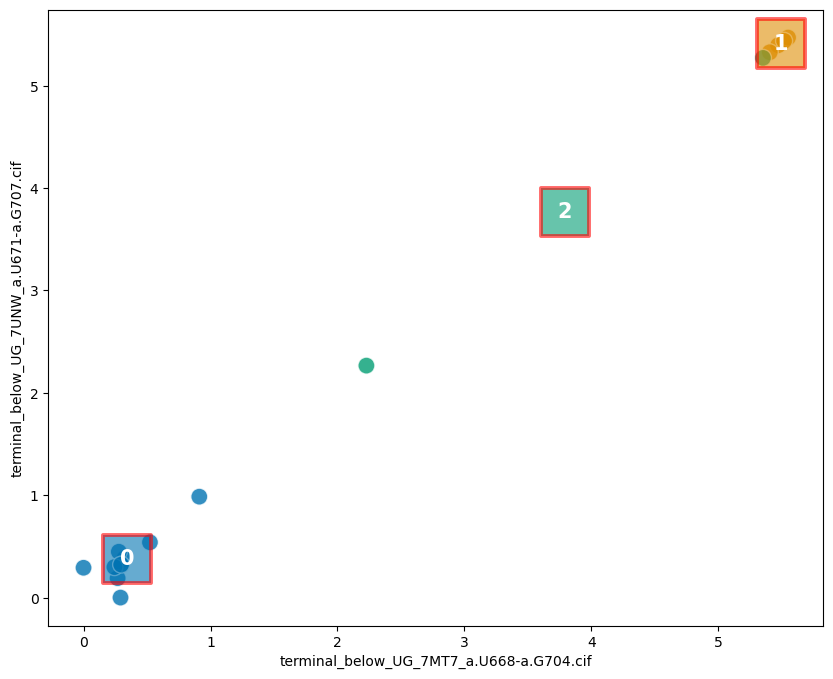

In [78]:
# Set the figure size
plt.figure(figsize=(10, 8))

#Plot the Clusters
ax = sns.scatterplot(data = ter_be_UG_RMSD2,
                     x = 'terminal_below_UG_7MT7_a.U668-a.G704.cif',
                     y = 'terminal_below_UG_7UNW_a.U671-a.G707.cif', 
                     hue = km.labels_, 
                     palette = 'colorblind', 
                     alpha = 0.8, 
                     s = 150,
                     legend = False)

#Plot the Centroids
ax = sns.scatterplot(data = cluster_centers, 
                     x = 'terminal_below_UG_7MT7_a.U668-a.G704.cif',
                     y = 'terminal_below_UG_7UNW_a.U671-a.G707.cif', 
                     hue = cluster_centers.index, 
                     palette = 'colorblind', 
                     s = 1200, 
                     legend = False,
                     alpha= 0.6,
                     ec = 'red',
                     marker = 's')

# Add Centroid Labels
for i in range(len(cluster_centers)):
               plt.text(x = cluster_centers['terminal_below_UG_7MT7_a.U668-a.G704.cif'][i], 
                        y = cluster_centers['terminal_below_UG_7UNW_a.U671-a.G707.cif'][i],
                        s = i, 
                        horizontalalignment='center',
                        verticalalignment='center',
                        size = 15,
                        weight = 'bold',
                        color = 'white')

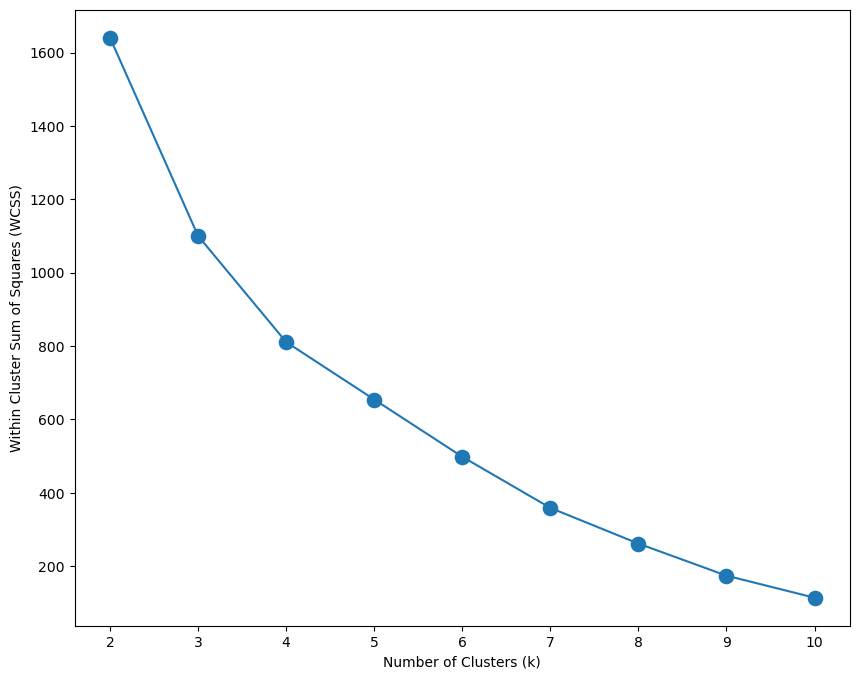

In [70]:
wcss = []
for k in range(2, 11):
    km = KMeans(n_clusters = k, n_init = 25, random_state = 1234)
    km.fit(ter_above_GU_below_UG_RMSD2)
    wcss.append(km.inertia_)

wcss_series = pd.Series(wcss, index = range(2, 11))

plt.figure(figsize=(10, 8))
ax = sns.lineplot(y = wcss_series, x = wcss_series.index)
ax = sns.scatterplot(y = wcss_series, x = wcss_series.index, s = 150)
ax = ax.set(xlabel = 'Number of Clusters (k)', 
            ylabel = 'Within Cluster Sum of Squares (WCSS)')

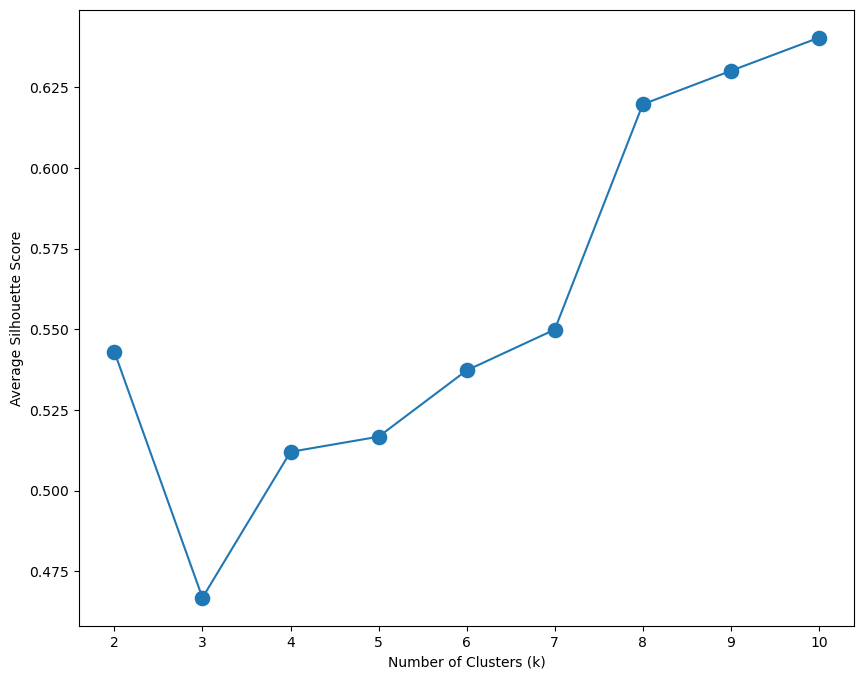

In [72]:
from sklearn.metrics import silhouette_score

silhouette = []
for k in range(2, 11):
    km = KMeans(n_clusters = k, n_init = 25, random_state = 1234)
    km.fit(ter_above_GU_below_UG_RMSD2)
    silhouette.append(silhouette_score(ter_above_GU_below_UG_RMSD2, km.labels_))

silhouette_series = pd.Series(silhouette, index = range(2, 11))

plt.figure(figsize=(10, 8))
ax = sns.lineplot(y = silhouette_series, x = silhouette_series.index)
ax = sns.scatterplot(y = silhouette_series, x = silhouette_series.index, s = 150)
ax = ax.set(xlabel = 'Number of Clusters (k)', 
            ylabel = 'Average Silhouette Score')

In [171]:
all_RMSD4= pd.read_csv('all_against_all_RMSD_reg3.csv')

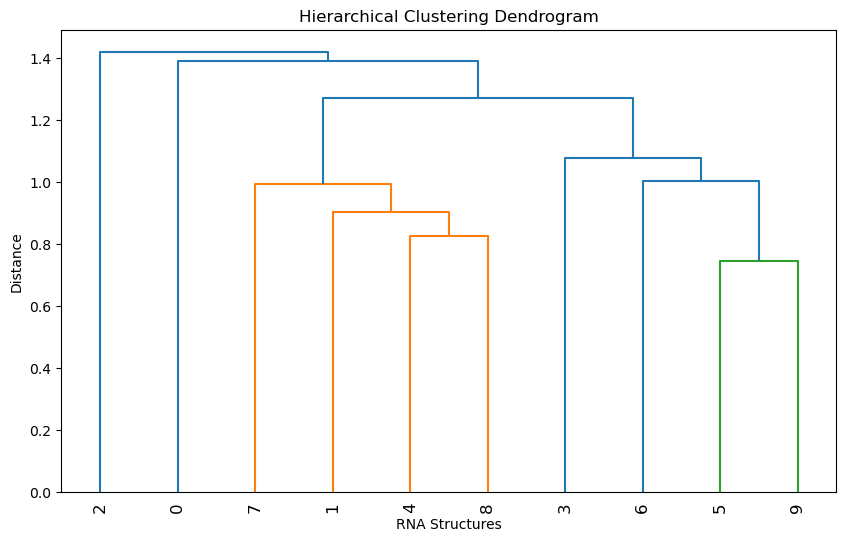

In [1]:
import numpy as np
from scipy.cluster import hierarchy
import matplotlib.pyplot as plt

# Step 1: Compute RMSD matrix (replace this with your actual RMSD calculation)
# Assuming rmsd_matrix is your computed RMSD matrix
rmsd_matrix = np.random.rand(10, 10)  # Replace this with your actual RMSD matrix

# Step 2: Perform hierarchical clustering
linkage_matrix = hierarchy.linkage(rmsd_matrix, method='average')  # Choose appropriate linkage method

# Step 3: Visualize dendrogram
plt.figure(figsize=(10, 6))
dn = hierarchy.dendrogram(linkage_matrix, labels=range(len(rmsd_matrix)), leaf_rotation=90)
plt.xlabel('RNA Structures')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()


In [28]:
rmsd_matrix

array([[0.19008084, 0.02177722, 0.42422891, 0.33374008, 0.16645438,
        0.08233596, 0.78657128, 0.13000371, 0.07084299, 0.09218722],
       [0.10287488, 0.53224645, 0.18401797, 0.0533586 , 0.5059549 ,
        0.70836843, 0.42841913, 0.25244329, 0.28775511, 0.45176589],
       [0.66024113, 0.04037615, 0.09278745, 0.90836554, 0.70557357,
        0.22302106, 0.16984956, 0.88104377, 0.29794838, 0.19751596],
       [0.7752312 , 0.6362149 , 0.84433575, 0.8988728 , 0.41368943,
        0.5374045 , 0.14595384, 0.46099497, 0.20268553, 0.16999517],
       [0.02169667, 0.70497268, 0.42411732, 0.14732793, 0.31515402,
        0.351409  , 0.63741756, 0.60618396, 0.84872208, 0.28526531],
       [0.68067161, 0.60712861, 0.56168752, 0.58274051, 0.46996594,
        0.64316067, 0.81448018, 0.5837393 , 0.39810028, 0.62111803],
       [0.81263938, 0.88014837, 0.98587557, 0.55590982, 0.98849869,
        0.48413845, 0.66356073, 0.22659394, 0.16759397, 0.69396297],
       [0.10257917, 0.97307809, 0.6816508

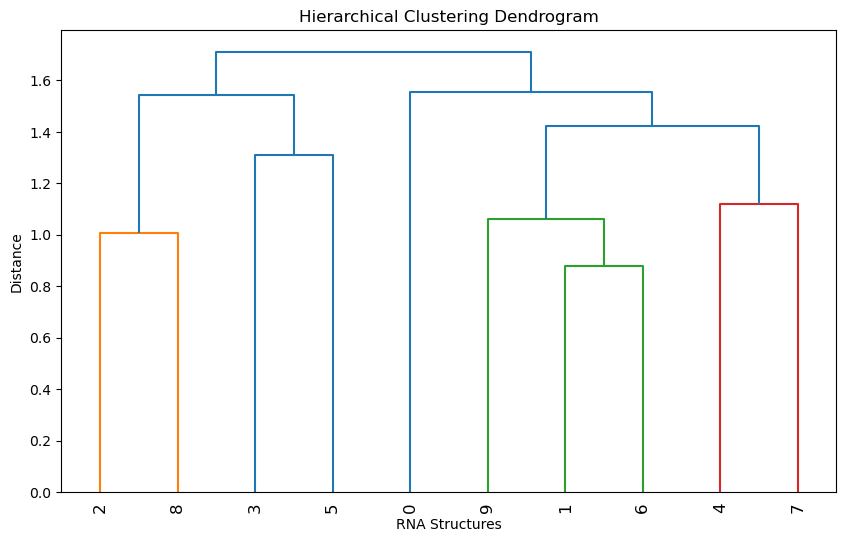

In [29]:
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Step 1: Calculate RMSD and create a symmetric dataframe
# Example: assuming rmsd_matrix is a symmetric NumPy array containing pairwise RMSD values
# Replace this with your actual RMSD calculation method
rmsd_matrix = np.random.rand(10, 10)  # Example random RMSD matrix
np.fill_diagonal(rmsd_matrix, 0)  # Set diagonal elements to 0
rmsd_df = pd.DataFrame(rmsd_matrix)

# Step 2: Perform hierarchical clustering
# Use complete linkage method (other methods like single or average can also be used)
clusters = linkage(rmsd_df, method='complete')

# Step 3: Visualize the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(clusters, labels=rmsd_df.index, leaf_rotation=90)
plt.xlabel('RNA Structures')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()


In [9]:
# Remove column name 'A'
all_RMSD1= all_RMSD.drop(['#'], axis=1)
all_RMSD1

,reg3_7UVY_a.U674-a.G710.cif,reg3_4YBB_DA.G2304-DA.U2312.cif,reg3_6XU8_A5.G2811-A5.U3128.cif,reg3_6XHW_1A.G2304-1A.U2312.cif,reg3_7MT2_A.G471-A.U481.cif,reg3_4U3N_1.U2875-1.G2952.cif,reg3_7NHN_A.G2337-A.U2345.cif,reg3_8EV3_6.G105-6.U179.cif,reg3_7TTW_1.G1515-1.U1565.cif,reg3_8CVJ_1a.U677-1a.G713.cif,...,reg3_7VYX_C.G22-C.U40.cif,reg3_7QWQ_5.G4740-5.U4959.cif,reg3_7R7A_1.U441-1.G493.cif,reg3_5NGM_Aa.U685-Aa.G721.cif,reg3_6WRU_1.G1577-1.U1589.cif,reg3_5NGM_AA.G428-AA.U438.cif,reg3_7QEP_3.U556-3.G592.cif,reg3_6SKF_BA.G1015-BA.U1024.cif,reg3_5T2A_2.G2006-2.U2022.cif,reg3_7UNU_A.G2291-A.U2299.cif
0,0,0.927915,1.406613,0.829876,1.010577,5.315036,1.094162,5.782462,0.573467,0.28501,...,0.675527,0.560821,2.122167,0.378978,4.622516,1.308363,0.947998,1.267219,0.246071,0.814614
1,0.927915,0,3.544271,0.767818,2.259948,2.900442,1.11313,5.31748,6.204958,2.269306,...,2.297828,3.167573,2.247464,2.2102,4.619394,2.794047,5.807934,3.45461,6.321734,0.535903
2,1.406613,3.544271,0,3.624258,2.586742,3.452157,3.140393,5.051794,2.664702,1.406225,...,2.937807,3.564343,5.572956,1.351925,4.213416,2.564255,5.139905,2.386091,2.770192,3.432654
3,0.829876,0.767818,3.624258,0,2.465503,1.031944,1.35729,3.563202,2.218288,2.368864,...,2.668476,3.335383,2.347381,2.302107,2.977701,2.976943,5.012064,3.407792,3.211477,0.958018
4,1.010577,2.259948,2.586742,2.465503,0,1.157851,2.102908,5.932758,1.37616,0.8814,...,1.482748,2.505302,0.813742,0.699541,1.691021,0.640629,0.753779,3.367229,1.599543,2.094631
5,5.315036,2.900442,3.452157,1.031944,1.157851,0,0.931627,6.271675,3.474927,5.320767,...,0.94804,6.166886,7.23424,5.368594,1.227581,3.413465,5.792231,1.884849,6.437652,2.658342
6,1.094162,1.11313,3.140393,1.35729,2.102908,0.931627,0,3.159626,2.291042,2.380445,...,2.463292,3.106961,2.371773,2.314412,2.684496,2.587488,5.022922,3.31373,2.975036,1.069337
7,5.782462,5.31748,5.051794,3.563202,5.932758,6.271675,3.159626,0,0.677878,5.813497,...,1.646706,1.444723,4.945025,5.806283,1.481071,5.580859,4.928135,2.308477,0.642688,5.983691
8,0.573467,6.204958,2.664702,2.218288,1.37616,3.474927,2.291042,0.677878,0,0.464175,...,1.159527,1.804895,5.169623,0.490806,1.281637,1.339742,0.496742,2.6173,0.789971,6.051478
9,0.28501,2.269306,1.406225,2.368864,0.8814,5.320767,2.380445,5.813497,0.464175,0,...,0.750383,0.550628,2.131359,0.384769,4.5724,1.313155,0.947292,1.226441,0.325418,0.917819


In [10]:
labels_dict= {}
reg3_names= [j[5:].rstrip('.cif') for i,j in enumerate(list(all_RMSD1.columns))]
for i,j in enumerate(reg3_names):
    labels_dict[i]=j

In [11]:
all_RMSD1.index= reg3_names
all_RMSD1

,reg3_7UVY_a.U674-a.G710.cif,reg3_4YBB_DA.G2304-DA.U2312.cif,reg3_6XU8_A5.G2811-A5.U3128.cif,reg3_6XHW_1A.G2304-1A.U2312.cif,reg3_7MT2_A.G471-A.U481.cif,reg3_4U3N_1.U2875-1.G2952.cif,reg3_7NHN_A.G2337-A.U2345.cif,reg3_8EV3_6.G105-6.U179.cif,reg3_7TTW_1.G1515-1.U1565.cif,reg3_8CVJ_1a.U677-1a.G713.cif,...,reg3_7VYX_C.G22-C.U40.cif,reg3_7QWQ_5.G4740-5.U4959.cif,reg3_7R7A_1.U441-1.G493.cif,reg3_5NGM_Aa.U685-Aa.G721.cif,reg3_6WRU_1.G1577-1.U1589.cif,reg3_5NGM_AA.G428-AA.U438.cif,reg3_7QEP_3.U556-3.G592.cif,reg3_6SKF_BA.G1015-BA.U1024.cif,reg3_5T2A_2.G2006-2.U2022.cif,reg3_7UNU_A.G2291-A.U2299.cif
7UVY_a.U674-a.G710,0,0.927915,1.406613,0.829876,1.010577,5.315036,1.094162,5.782462,0.573467,0.28501,...,0.675527,0.560821,2.122167,0.378978,4.622516,1.308363,0.947998,1.267219,0.246071,0.814614
4YBB_DA.G2304-DA.U2312,0.927915,0,3.544271,0.767818,2.259948,2.900442,1.11313,5.31748,6.204958,2.269306,...,2.297828,3.167573,2.247464,2.2102,4.619394,2.794047,5.807934,3.45461,6.321734,0.535903
6XU8_A5.G2811-A5.U3128,1.406613,3.544271,0,3.624258,2.586742,3.452157,3.140393,5.051794,2.664702,1.406225,...,2.937807,3.564343,5.572956,1.351925,4.213416,2.564255,5.139905,2.386091,2.770192,3.432654
6XHW_1A.G2304-1A.U2312,0.829876,0.767818,3.624258,0,2.465503,1.031944,1.35729,3.563202,2.218288,2.368864,...,2.668476,3.335383,2.347381,2.302107,2.977701,2.976943,5.012064,3.407792,3.211477,0.958018
7MT2_A.G471-A.U481,1.010577,2.259948,2.586742,2.465503,0,1.157851,2.102908,5.932758,1.37616,0.8814,...,1.482748,2.505302,0.813742,0.699541,1.691021,0.640629,0.753779,3.367229,1.599543,2.094631
4U3N_1.U2875-1.G2952,5.315036,2.900442,3.452157,1.031944,1.157851,0,0.931627,6.271675,3.474927,5.320767,...,0.94804,6.166886,7.23424,5.368594,1.227581,3.413465,5.792231,1.884849,6.437652,2.658342
7NHN_A.G2337-A.U2345,1.094162,1.11313,3.140393,1.35729,2.102908,0.931627,0,3.159626,2.291042,2.380445,...,2.463292,3.106961,2.371773,2.314412,2.684496,2.587488,5.022922,3.31373,2.975036,1.069337
8EV3_6.G105-6.U179,5.782462,5.31748,5.051794,3.563202,5.932758,6.271675,3.159626,0,0.677878,5.813497,...,1.646706,1.444723,4.945025,5.806283,1.481071,5.580859,4.928135,2.308477,0.642688,5.983691
7TTW_1.G1515-1.U1565,0.573467,6.204958,2.664702,2.218288,1.37616,3.474927,2.291042,0.677878,0,0.464175,...,1.159527,1.804895,5.169623,0.490806,1.281637,1.339742,0.496742,2.6173,0.789971,6.051478
8CVJ_1a.U677-1a.G713,0.28501,2.269306,1.406225,2.368864,0.8814,5.320767,2.380445,5.813497,0.464175,0,...,0.750383,0.550628,2.131359,0.384769,4.5724,1.313155,0.947292,1.226441,0.325418,0.917819


In [122]:
all_RMSD2= all_RMSD.drop(['#'], axis=1)

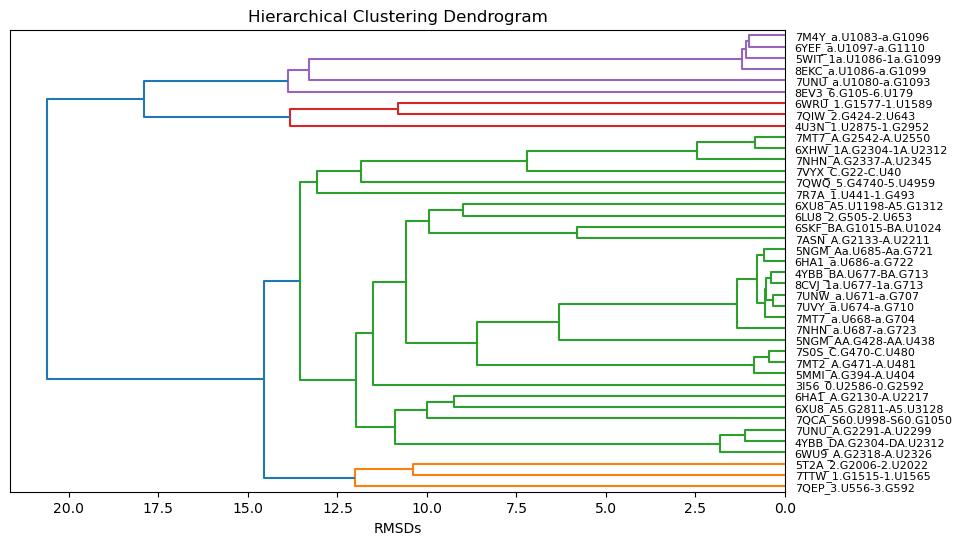

In [123]:
clusters = hierarchy.linkage(all_RMSD2, method='average')

# Step 3: Visualize the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(clusters, labels=reg3_names, leaf_rotation=0, orientation='left')
plt.xlabel('RMSDs')
#plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster


# Convert DataFrame to squareform distance matrix
rmsd_matrix = squareform(all_RMSD1.values)

# Perform hierarchical clustering
linkage_matrix = linkage(rmsd_matrix, method='average')

# Plot dendrogram
plt.figure(figsize=(20, 20), dpi = 1200)
dendrogram(linkage_matrix, labels=all_RMSD1.index, leaf_rotation=0, orientation='left', color_threshold= 1.7, leaf_font_size=20)



plt.xticks(fontsize=14) 
#plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('RMSD', fontsize=14)
#plt.ylabel('Distance')
plt.show()

# Determine number of clusters (can be adjusted based on dendrogram)
#num_clusters = 6

# Assign cluster labels
#cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Print cluster labels
#print("Cluster Labels:", cluster_labels)

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster


# Convert DataFrame to squareform distance matrix
rmsd_matrix = squareform(all_RMSD1.values)

# Perform hierarchical clustering
linkage_matrix = linkage(rmsd_matrix, method='complete')

# Plot dendrogram
plt.figure(figsize=(20, 20), dpi = 1200)
dendrogram(linkage_matrix, labels=all_RMSD1.index, leaf_rotation=0, orientation='left', color_threshold= 1.7, leaf_font_size=20)



plt.xticks(fontsize=14) 
#plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('RMSD', fontsize=14)
#plt.ylabel('Distance')
plt.show()

# Determine number of clusters (can be adjusted based on dendrogram)
#num_clusters = 6

# Assign cluster labels
#cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Print cluster labels
#print("Cluster Labels:", cluster_labels)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster


# Convert DataFrame to squareform distance matrix
rmsd_matrix = squareform(all_RMSD1.values)

# Perform hierarchical clustering
linkage_matrix = linkage(rmsd_matrix, method='single')

# Plot dendrogram
plt.figure(figsize=(20, 20), dpi = 1200)
dendrogram(linkage_matrix, labels=all_RMSD1.index, leaf_rotation=0, orientation='left', color_threshold= 0.3, leaf_font_size=20)



plt.xticks(fontsize=14) 
#plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('RMSD', fontsize=14)
#plt.ylabel('Distance')
plt.show()

# Determine number of clusters (can be adjusted based on dendrogram)
#num_clusters = 6

# Assign cluster labels
#cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Print cluster labels
#print("Cluster Labels:", cluster_labels)

In [13]:
all_RMSD1.to_csv('all_against_all_RMSD_reg3.csv')

In [14]:
linkage_matrix

array([[ 0.        , 15.        ,  0.18956327,  2.        ],
       [28.        , 39.        ,  0.21789448,  2.        ],
       [41.        , 42.        ,  0.26395011,  4.        ],
       [ 4.        , 17.        ,  0.2664721 ,  2.        ],
       [ 8.        , 27.        ,  0.27158856,  2.        ],
       [18.        , 34.        ,  0.2780157 ,  2.        ],
       [ 9.        , 43.        ,  0.29218343,  5.        ],
       [22.        , 46.        ,  0.31592792,  3.        ],
       [14.        , 19.        ,  0.31901354,  2.        ],
       [10.        , 16.        ,  0.32016847,  2.        ],
       [47.        , 48.        ,  0.34343696,  8.        ],
       [11.        , 29.        ,  0.38160506,  2.        ],
       [25.        , 44.        ,  0.42570898,  3.        ],
       [13.        , 51.        ,  0.49955841,  9.        ],
       [26.        , 50.        ,  0.53514555,  3.        ],
       [ 1.        , 40.        ,  0.53590274,  2.        ],
       [12.        , 49.

In [62]:
all_RMSD.to_csv('all_against_all_RMSD_reg3.csv', index= False)

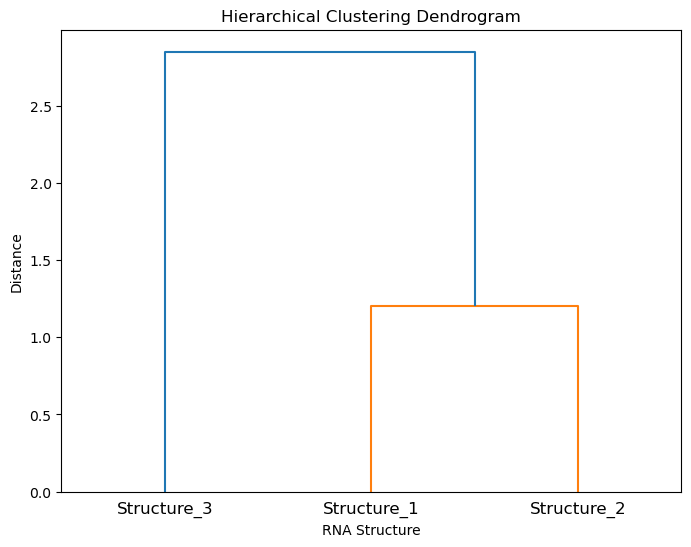

Cluster Labels: [1 1 1]


In [12]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt

# Example DataFrame of RMSD values (replace with your data)
# Assume the DataFrame has structure IDs as row/column indices and RMSD values as the data
rmsd_df = pd.DataFrame({
    'Structure_1': [0.0, 1.2, 2.3],
    'Structure_2': [1.2, 0.0, 3.4],
    'Structure_3': [2.3, 3.4, 0.0]
}, index=['Structure_1', 'Structure_2', 'Structure_3'])

# Convert DataFrame to squareform distance matrix
rmsd_matrix = squareform(rmsd_df.values)

# Perform hierarchical clustering
linkage_matrix = linkage(rmsd_matrix, method='average')

# Plot dendrogram
plt.figure(figsize=(8, 6))
dendrogram(linkage_matrix, labels=rmsd_df.index)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('RNA Structure')
plt.ylabel('Distance')
plt.show()

# Determine number of clusters (can be adjusted based on dendrogram)
num_clusters = 2

# Assign cluster labels
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Print cluster labels
print("Cluster Labels:", cluster_labels)


In [1]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
import matplotlib.pyplot as plt


# Convert DataFrame to squareform distance matrix
rmsd_matrix = squareform(all_RMSD1.values)


# Perform hierarchical clustering
linkage_matrix = linkage(rmsd_matrix, method='average')
print (linkage_matrix)

# Plot dendrogram
plt.figure(figsize=(8, 6))
dendrogram(linkage_matrix, labels=all_RMSD1.index, leaf_rotation=0, orientation='left')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('RNA Structure')
plt.ylabel('Distance')
plt.show()

# Determine number of clusters (can be adjusted based on dendrogram)
num_clusters = 2

# Assign cluster labels
cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')

# Print cluster labels
print("Cluster Labels:", cluster_labels)


NameError: name 'all_RMSD1' is not defined

In [139]:
all_RMSD2.columns

Index(['reg3_7UVY_a.U674-a.G710.cif', 'reg3_4YBB_DA.G2304-DA.U2312.cif',
       'reg3_6XU8_A5.G2811-A5.U3128.cif', 'reg3_6XHW_1A.G2304-1A.U2312.cif',
       'reg3_7MT2_A.G471-A.U481.cif', 'reg3_4U3N_1.U2875-1.G2952.cif',
       'reg3_7NHN_A.G2337-A.U2345.cif', 'reg3_8EV3_6.G105-6.U179.cif',
       'reg3_7TTW_1.G1515-1.U1565.cif', 'reg3_8CVJ_1a.U677-1a.G713.cif',
       'reg3_7UNU_a.U1080-a.G1093.cif', 'reg3_7QCA_S60.U998-S60.G1050.cif',
       'reg3_5WIT_1a.U1086-1a.G1099.cif', 'reg3_7NHN_a.U687-a.G723.cif',
       'reg3_6YEF_a.U1097-a.G1110.cif', 'reg3_7UNW_a.U671-a.G707.cif',
       'reg3_8EKC_a.U1086-a.G1099.cif', 'reg3_7S0S_C.G470-C.U480.cif',
       'reg3_7MT7_a.U668-a.G704.cif', 'reg3_7MT7_A.G2542-A.U2550.cif',
       'reg3_6LU8_2.G505-2.U653.cif', 'reg3_7ASN_A.G2133-A.U2211.cif',
       'reg3_6HA1_a.U686-a.G722.cif', 'reg3_6WU9_A.G2318-A.U2326.cif',
       'reg3_7QIW_2.G424-2.U643.cif', 'reg3_5MMI_A.G394-A.U404.cif',
       'reg3_7M4Y_a.U1083-a.G1096.cif', 'reg3_3I56_0.U2586-0.G

In [121]:
all_RMSD

,#,reg3_7UVY_a.U674-a.G710.cif,reg3_4YBB_DA.G2304-DA.U2312.cif,reg3_6XU8_A5.G2811-A5.U3128.cif,reg3_6XHW_1A.G2304-1A.U2312.cif,reg3_7MT2_A.G471-A.U481.cif,reg3_4U3N_1.U2875-1.G2952.cif,reg3_7NHN_A.G2337-A.U2345.cif,reg3_8EV3_6.G105-6.U179.cif,reg3_7TTW_1.G1515-1.U1565.cif,...,reg3_7VYX_C.G22-C.U40.cif,reg3_7QWQ_5.G4740-5.U4959.cif,reg3_7R7A_1.U441-1.G493.cif,reg3_5NGM_Aa.U685-Aa.G721.cif,reg3_6WRU_1.G1577-1.U1589.cif,reg3_5NGM_AA.G428-AA.U438.cif,reg3_7QEP_3.U556-3.G592.cif,reg3_6SKF_BA.G1015-BA.U1024.cif,reg3_5T2A_2.G2006-2.U2022.cif,reg3_7UNU_A.G2291-A.U2299.cif
0,reg3_7UVY_a.U674-a.G710.cif,0.000000,2.302628,1.406613,2.401468,0.920581,5.315036,2.399483,5.782462,0.573467,...,0.853957,1.517200,2.122167,0.378978,4.622516,1.308363,0.947998,1.267219,0.390615,2.167617
1,reg3_4YBB_DA.G2304-DA.U2312.cif,0.927915,0.000000,3.544272,0.767817,2.259948,2.900442,1.113130,5.976923,6.204959,...,2.297829,3.167573,0.603142,0.904183,4.619395,2.794048,5.807934,3.454610,6.321735,0.535903
2,reg3_6XU8_A5.G2811-A5.U3128.cif,1.406613,3.544271,0.000000,3.624258,2.586743,3.452157,3.140393,4.989092,2.664702,...,2.937807,3.564344,5.572956,1.351925,4.213417,2.564255,5.139905,2.386090,2.770192,3.432654
3,reg3_6XHW_1A.G2304-1A.U2312.cif,0.829876,0.767818,3.624258,0.000000,2.465503,0.757685,1.357289,3.563203,2.218287,...,2.668478,3.335383,0.811865,0.819625,2.977702,2.976943,0.861298,3.407792,3.211477,0.958018
4,reg3_7MT2_A.G471-A.U481.cif,1.010577,2.259949,2.586742,2.465503,0.000000,0.680852,2.102907,5.932759,1.376159,...,1.482749,2.505302,0.362199,0.984609,1.691023,0.640628,1.032144,3.367227,1.599543,2.094631
5,reg3_4U3N_1.U2875-1.G2952.cif,5.315038,2.900442,3.452157,1.031944,1.157850,0.000000,0.938659,6.271675,3.474927,...,1.240974,6.166884,7.234242,5.368596,1.227580,3.413465,5.792230,1.760911,6.437654,2.658342
6,reg3_7NHN_A.G2337-A.U2345.cif,1.094161,1.113130,3.140394,1.357289,2.102909,0.931625,0.000000,3.159627,2.291041,...,2.463294,3.106963,0.728741,1.039057,2.684497,2.587488,1.083963,3.313730,2.975036,1.069337
7,reg3_8EV3_6.G105-6.U179.cif,5.782463,5.317480,5.051795,3.563203,5.932758,6.271674,3.159625,0.000000,0.677877,...,1.646706,1.444721,0.919828,5.806283,1.481071,5.580860,2.565223,2.308476,0.642686,5.239949
8,reg3_7TTW_1.G1515-1.U1565.cif,0.573471,6.204959,2.664704,2.218289,1.376158,3.474930,2.291039,0.677875,0.000000,...,1.159530,1.804894,5.169624,0.490806,1.281640,1.339741,0.496739,2.617300,0.789969,6.051481
9,reg3_8CVJ_1a.U677-1a.G713.cif,0.285010,2.269310,1.406224,2.368863,0.881400,5.320768,2.380443,5.813498,0.464177,...,0.746491,1.544008,2.131359,0.384768,4.572403,1.313155,0.947293,1.226442,0.242871,2.151674


IndexError: index 19 is out of bounds for axis 0 with size 19

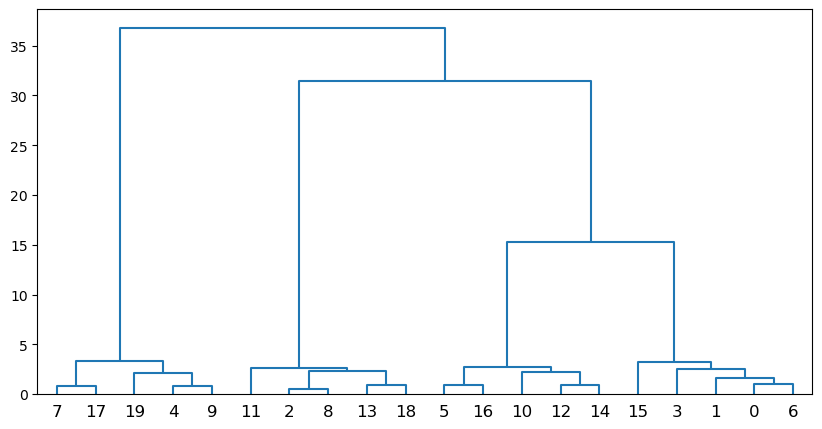

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.datasets import make_blobs

# Generate sample data
X, _ = make_blobs(n_samples=20, centers=4, random_state=42)

# Perform hierarchical clustering
Z = linkage(X, method='ward')

# Plot dendrogram with sorted leaf nodes
plt.figure(figsize=(10, 5))
dendrogram(Z, color_threshold=0)

# Get the optimal leaf order
optimal_order = dendrogram(Z, no_plot=True)['leaves']

# Sort leaf nodes based on cluster labels
leaf_order = sorted(range(len(X)), key=lambda x: Z[optimal_order[x], 0])

# Replot the dendrogram with sorted leaf nodes
dendrogram(Z, color_threshold=0, labels=leaf_order)
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()
